# Figures

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from ws_crl.plotting import init_plt
from omegaconf import OmegaConf
from experiments.cubes_2d import create_model, get_dataloader, plot_loop
import os
import torch
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np
from collections import defaultdict
from experiments.cubes_2d import eval_dci_scores, eval_implicit_graph
from ws_crl.plotting import plot_metric_spread
import pandas as pd
from ws_crl.plotting import (
    plot_average_intervention_posterior,
    plot_counterfactuals,
    plot_graph,
    plot_importance_matrix,
    plot_latent_space,
    plot_solution_function_responses,
    plot_reconstructions,
    plot_counterfactual_sequences,
)
from ws_crl.utils import (
    calculate_average_intervention_posterior,
    calculate_intervention_posteriors,
    generate_directed_graph_matrix,
)
from ws_crl.utils import get_first_batch
from ws_crl.plotting import plot_x
from ws_crl.plotting import intervene
from ws_crl.posthoc_graph_learning.enco import run_enco

torch.set_grad_enabled(False)

pd.options.mode.chained_assignment = None


init_plt()
format = "svg"
base_dir = "/mnt/raid/ni/jonasb/wscrl"

/mnt/antares_raid/home/jonasb/mambaforge/envs/wscrl/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/mnt/antares_raid/home/jonasb/Projects/wscrl/repo/experiments/cubes_2d.py:69: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  @hydra.main(


In [3]:
data_dir_by_dataset = {
    # 1dcubes
    "1d_son_small": "/mnt/raid/ni/jonasb/wscrl/data/1dcubes_0.05_child_noise_causal_variables",
    "1d_son_equi": "/mnt/raid/ni/jonasb/wscrl/data/1dcubes_equi_child_noise_causal_variables",
    "1d_encoding_small": "/mnt/raid/ni/jonasb/wscrl/data/encoded/1dcubes_0.05_child_noise_0_epoch_399",
    "1d_encoding_small_with_equi": "/mnt/raid/ni/jonasb/wscrl/data/encoded/1dcubes_0.05_child_noise_encoded_with_1dcubes_equi_child_noise_0_epoch_399",
    "1d_encoding_equi": None,
    # 2dcubes
    "2d_son_small": "/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equiscale_0.05_child_noise_causal_variables",
    "2d_son_equi": "/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equiscale_equi_child_noise_causal_variables",
    "2d_encoding_small_with_equi": "/mnt/raid/ni/jonasb/wscrl/data/encoded/2dcubes_equiscale_0.05_child_noise_encoded_with_2dcubes_equiscale_equi_child_noise_blackbg_0_799",
    "2d_encoding_equi": "/mnt/raid/ni/jonasb/wscrl/data/encoded/2dcubes_equiscale_equi_child_noise_blackbg_0_epoch_799",
    "2d_encoding_small": "/mnt/raid/ni/jonasb/wscrl/data/encoded/2dcubes_equiscale_0.05_child_noise_blackbg_0_epoch_799",
    "2d_quadratic_son_equi": "/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equiscale_grayscale_equi_child_noise_quadratic_skip_render_causal_variables",
}

cubes_1d_true_graph = torch.tensor([[0, 0, 1], [0, 0, 1], [0, 0, 0]])
cubes_2d_true_graph = torch.tensor(
    [
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0],
    ]
)

In [4]:
def get_run_dir_for_run_name(run_name, base_dir=base_dir, exp_name_prefix=None):
    if exp_name_prefix is not None:
        exp_dirs = list(Path(base_dir).glob(f"{exp_name_prefix}*"))
    else:
        exp_dirs = list(Path(base_dir).glob("*"))

    print(f"Finding {run_name}...")

    for exp_dir in exp_dirs:
        conf_path = exp_dir / "config.yml"
        if not conf_path.exists():
            continue
        conf = OmegaConf.load(conf_path)
        if conf.general.run_name == run_name:
            return exp_dir
    raise ValueError(f"Run {run_name} not found")

In [5]:
def get_image_decoder(cfg):
    if (
        cfg.data.data_dir
        == "/mnt/raid/ni/jonasb/wscrl/data/encoded/2dcubes_equiscale_equi_child_noise_blackbg_0_epoch_799"
        or cfg.data.data_dir
        == "/mnt/raid/ni/jonasb/wscrl/data/encoded/2dcubes_equiscale_0.05_child_noise_encoded_with_2dcubes_equiscale_equi_child_noise_blackbg_0_799"
    ):
        image_decoder_path = "/mnt/antares_raid/home/jonasb/Projects/spatialvaes/logs/SpatialBroadcastVAE/2dcubes_equiscale_equi_child_noise_blackbg/0"
        image_decoder_model_name = "epoch_799.pt"
    elif (
        cfg.data.data_dir
        == "/mnt/raid/ni/jonasb/wscrl/data/encoded/2dcubes_equiscale_0.05_child_noise_blackbg_0_epoch_799"
    ):
        image_decoder_path = "/mnt/antares_raid/home/jonasb/Projects/spatialvaes/logs/SpatialBroadcastVAE/2dcubes_equiscale_0.05_child_noise_blackbg/0"
        image_decoder_model_name = "epoch_799.pt"
    else:
        image_decoder_path = None
        image_decoder_model_name = None

    return image_decoder_path, image_decoder_model_name

In [6]:
def setup_evaluation(exp_name, step=None, base_dir=base_dir, with_metrics=False):
    if step is not None:
        model_name = f"model_step_{step}.pt"
    else:
        model_name = "model.pt"

    model_path = os.path.join(base_dir, exp_name, "models", model_name)
    cfg_path = os.path.join(base_dir, exp_name, "config.yml")
    metrics_path = os.path.join(base_dir, exp_name, "metrics", "test_metrics.csv")
    batchsize = 64

    cfg = OmegaConf.load(cfg_path)
    cfg.data.always_generate_new_data = False

    model = create_model(cfg)
    train_loader = get_dataloader(
        cfg, "train", batchsize=batchsize, shuffle=True, include_noise_encodings=True
    )
    val_loader = get_dataloader(
        cfg, "val", batchsize=batchsize, shuffle=False, include_noise_encodings=True
    )
    if not Path(model_path).exists():
        if with_metrics:
            metrics = pd.read_csv(metrics_path).iloc[0].to_dict()
            return None, cfg, None, None, None, metrics
        # raise ValueError(f"Model path {model_path} does not exist")
        return None, cfg, None, None, None

    model.load_state_dict(torch.load(model_path))
    model.eval()

    device = torch.device(cfg.training.device)
    model.to(device)

    # Setup image decoder
    image_decoder_path, image_decoder_model_name = get_image_decoder(cfg)
    if image_decoder_path is not None:
        cfg.data.encoder = OmegaConf.create()
        cfg.data.encoder.type = "spatialvaes.sbd"
        cfg.data.encoder.exp_dir = image_decoder_path
        cfg.data.encoder.model_name = image_decoder_model_name

    if with_metrics:
        metrics = pd.read_csv(metrics_path).iloc[0].to_dict()
        return model, cfg, train_loader, val_loader, device, metrics

    return model, cfg, train_loader, val_loader, device

In [7]:
def compute_MAP_components(cfg, model, loader, device):
    intervention_posterior, intervention_label = calculate_intervention_posteriors(
        cfg, model, loader, device
    )
    average_intervention_posterior = calculate_average_intervention_posterior(
        cfg, intervention_posterior, intervention_label, device=device
    )
    _, MAP_interventions = average_intervention_posterior.max(dim=1)

    if len(torch.unique(MAP_interventions)) < cfg.model.dim_z + 1:
        # don't remap if not all components can be mapped
        print("Warning: Not all components can be mapped")
    # remove empty intervention
    MAP_components = MAP_interventions[MAP_interventions != 0] - 1
    return MAP_components


def eval_enco_graph(cfg, model, partition="train"):
    """Post-hoc graph evaluation with ENCO"""
    with torch.enable_grad():
        # Only want to do this for ILCMs
        if cfg.model.type not in ["intervention_noise_vae", "alt_intervention_noise_vae"]:
            return {}

        # Let's skip this for large latent spaces
        if cfg.model.dim_z > 8:
            return {}

        model.eval()
        device = torch.device(cfg.training.device)
        cpu = torch.device("cpu")
        model.to(device)

        # Load data and compute causal variables
        dataloader = get_dataloader(cfg, partition, cfg.eval.batchsize)
        z0s, z1s, interventions = [], [], []

        with torch.no_grad():
            for x0, x1, *_ in dataloader:
                x0, x1 = x0.to(device), x1.to(device)
                _, _, _, _, e0, e1, _, _, intervention = model.encode_decode_pair(
                    x0.to(device), x1.to(device)
                )
                z0 = model.scm.noise_to_causal(e0)
                z1 = model.scm.noise_to_causal(e1)

                z0s.append(z0.to(cpu))
                z1s.append(z1.to(cpu))
                interventions.append(intervention.to(cpu))

            z0s = torch.cat(z0s, dim=0).detach()
            z1s = torch.cat(z1s, dim=0).detach()
            interventions = torch.cat(interventions, dim=0).detach()

        # Run ENCO
        adjacency_matrix = (
            run_enco(z0s, z1s, interventions, lambda_sparse=cfg.eval.enco_lambda, device=device)
            .cpu()
            .detach()
        )

    return adjacency_matrix


def compare_graph_with_true_graph(
    exp_name, true_graph, method, implicit_threshold=0.05, from_metrics=False
):
    # exp_name = get_run_dir_for_run_name(run_name, exp_name_prefix=exp_name_prefix).name
    step = None
    model, cfg, train_loader, val_loader, device, metrics = setup_evaluation(
        exp_name, step=step, with_metrics=from_metrics
    )

    if model is None:
        print(f"Model for {exp_name} not found")
        return False

    if method == "ENCO":
        graph = eval_enco_graph(cfg, model, partition="val")
    elif method == "implicit":
        if metrics is not None:
            graph_dict = metrics
        else:
            graph_dict = eval_implicit_graph(cfg, model, dataloader=val_loader)
        graph = generate_directed_graph_matrix(graph_dict, f"implicit_graph_")
        graph = (torch.abs(graph) > implicit_threshold).float()
    else:
        raise ValueError(f"Method {method} not found")

    MAP_components = compute_MAP_components(cfg, model, val_loader, device).to("cpu")
    graph = graph[MAP_components][:, MAP_components]
    return (graph == true_graph).all()

## For specific model

In [16]:
exp_name = (
    "final_2dcubes_son_causal_variables_backup_2024-05-28_21:49:26"  # inquisitive-slug-111 (worst)
)
step = None

In [20]:
run_names_by_level = {
    1: "unequaled-ray-84",  # mlp
    2: "luxuriant-fish-118",  # mlp
    3: "puzzled-skink-58",  # mlp
    # 4: "bemused-rat-817",  # linear
    4: "blushing-fox-200",  # linear
}
exp_name = get_run_dir_for_run_name(
    run_names_by_level[4], exp_name_prefix="final_2dcubes_son_causal_variables"
).name
step = None

Finding blushing-fox-200...


In [134]:
exp_name = get_run_dir_for_run_name(
    # "burly-gnu-299", exp_name_prefix="final_2dcubes_image_encodings"
    # "gentle-mole-565", exp_name_prefix="final_2dcubes_image_encodings",
    # "unequaled-ray-84",
    "luxuriant-fish-118",  # distorted causal latent space
    # "bemused-rat-817",  # good causal latent space
    exp_name_prefix="final_2dcubes_son_causal_variables",
).name
# step = None
step = 30000

Finding luxuriant-fish-118...


In [135]:
model, cfg, train_loader, val_loader, device = setup_evaluation(exp_name, step=step)
run_name = cfg.general.run_name
step_name = step if step is not None else "final"
plot_dir = Path(f"./figures/{run_name}_step_{step_name}")
plot_dir.mkdir(parents=True, exist_ok=True)

if model:
    print(cfg.model.scm.type)
else:
    print("Model not found")

mlp


In [136]:
loader = val_loader
save_to_mlflow = False

metrics = defaultdict(list)
metrics.update(eval_dci_scores(cfg, model, test_loader=val_loader))
metrics.update(eval_dci_scores(cfg, model, test_loader=val_loader, interventional=True))
metrics.update(eval_implicit_graph(cfg, model, dataloader=val_loader))

intervention_posterior, intervention_label = calculate_intervention_posteriors(
    cfg, model, loader, device
)
average_intervention_posterior = calculate_average_intervention_posterior(
    cfg, intervention_posterior, intervention_label, device=device
)
_, MAP_interventions = average_intervention_posterior.max(dim=1)

In [137]:
if len(torch.unique(MAP_interventions)) < cfg.model.dim_z + 1:
    # don't remap if not all components can be mapped
    print("Warning: Not all components can be mapped")
    MAP_components = torch.arange(0, cfg.model.dim_z).int()
else:
    # remove empty intervention
    MAP_components = MAP_interventions[MAP_interventions != 0] - 1
MAP_components_inverse = torch.tensor(
    [list(MAP_components).index(i) for i in range(len(MAP_components))]
)

In [126]:
metrics["noise_disentanglement"]

0.6990986344143981

### Disentanglement

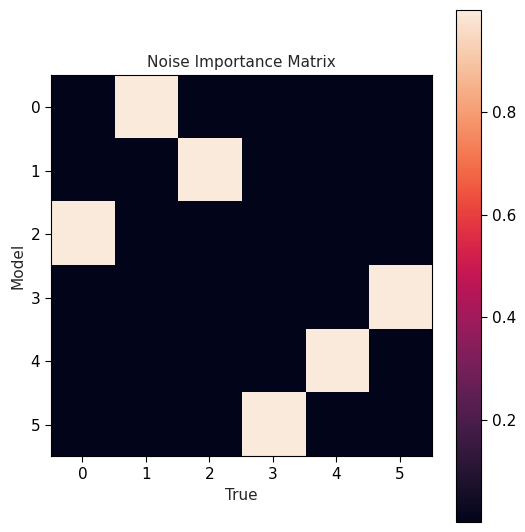

In [11]:
fig, ax = plot_importance_matrix(
    cfg,
    metrics,
    "noise",
    filename=plot_dir / f"importance_matrix_noise_step_{step_name}.{format}",
    artifact_folder="importance_matrix_noise",
    save_to_mlflow=save_to_mlflow,
)
fig

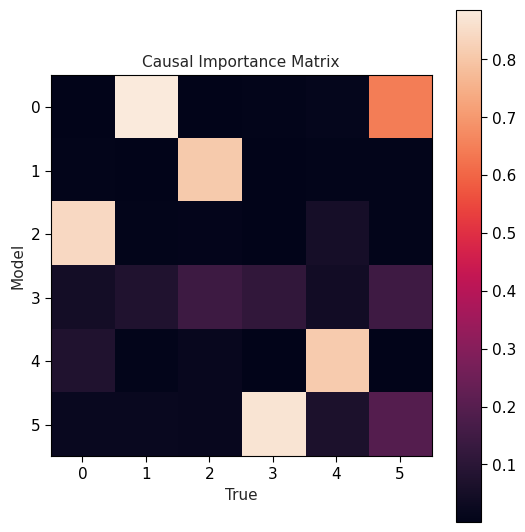

In [12]:
fig, ax = plot_importance_matrix(
    cfg,
    metrics,
    "causal",
    filename=plot_dir / f"importance_matrix_causal_step_{step_name}.{format}",
    artifact_folder="importance_matrix_causal",
    save_to_mlflow=save_to_mlflow,
)
fig

### Latent space

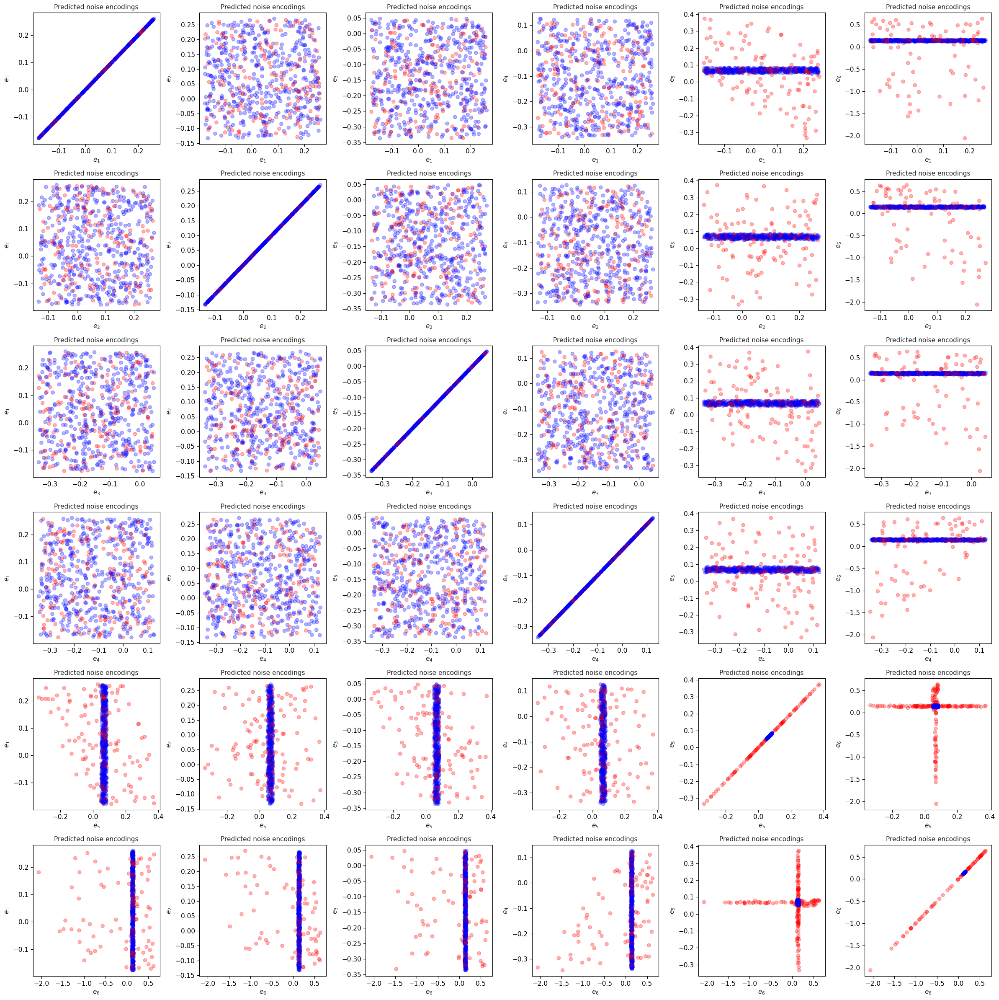

In [13]:
fig, axes = plot_latent_space(
    cfg,
    model,
    loader,
    MAP_interventions,
    device,
    causal=False,
    filename=plot_dir / f"latent_space_noise_step_{step_name}.{format}",
    artifact_folder="latent_space_noise",
    save_to_mlflow=save_to_mlflow,
)
fig

# Use last two rows to show ood

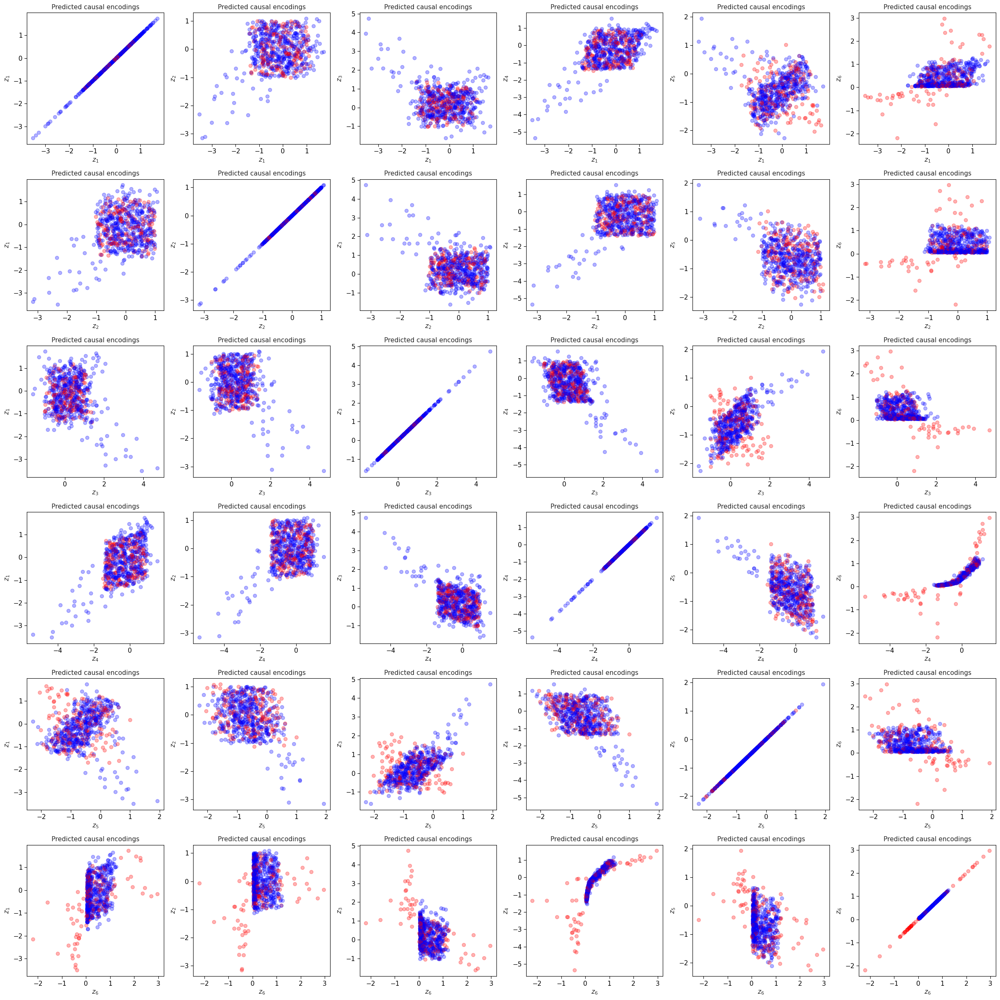

In [14]:
fig, axes = plot_latent_space(
    cfg,
    model,
    loader,
    MAP_interventions,
    device,
    causal=True,
    filename=plot_dir / f"latent_space_causal_step_{step_name}.{format}",
    artifact_folder="latent_space_causal",
    save_to_mlflow=save_to_mlflow,
)
fig

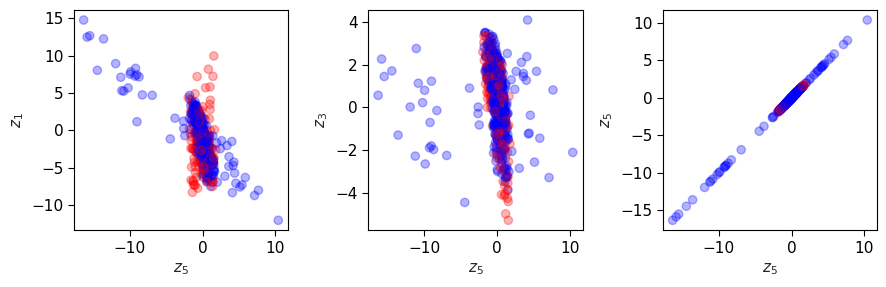

In [127]:
component_rows_to_plot = [4]
fig, axes = plot_latent_space(
    cfg,
    model,
    loader,
    MAP_interventions,
    device,
    causal=True,
    filename=plot_dir
    / f"latent_space_causal_step_{step_name}_components_{component_rows_to_plot}.png",
    artifact_folder="latent_space_causal",
    save_to_mlflow=save_to_mlflow,
    component_rows_to_plot=component_rows_to_plot,
    component_cols_to_plot=[0, 2, 4],
)
fig

### Conditional

In [129]:
x1, x2, z1, z2, *_, e1, e2 = get_first_batch(loader)

### Intervention encoder

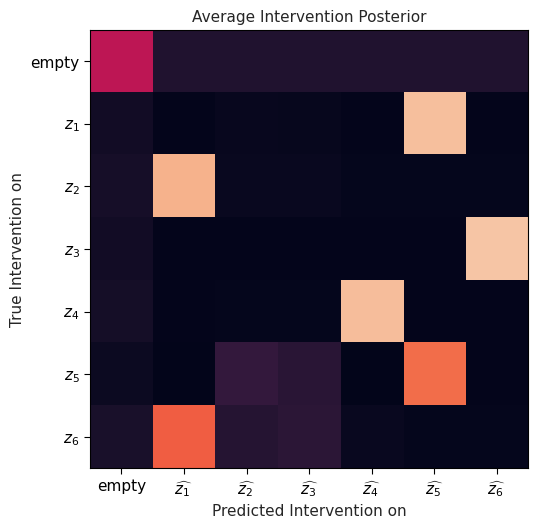

In [140]:
fig, ax = plot_average_intervention_posterior(
    cfg,
    average_intervention_posterior,
    filename=plot_dir / f"average_intervention_posterior_step_{step_name}.{format}",
    artifact_folder="average_intervention_posterior",
    save_to_mlflow=save_to_mlflow,
    cbar=False,
)
fig

### Reconstructions

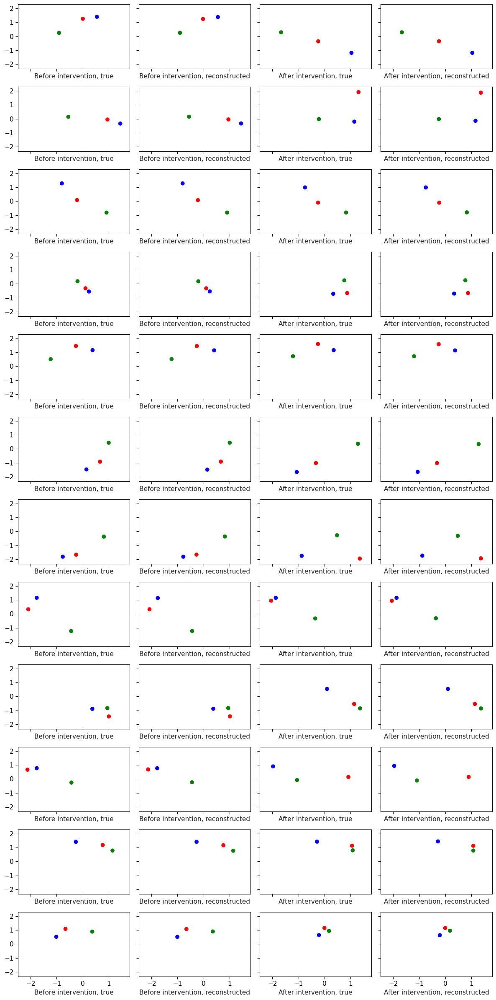

In [18]:
if "encoder" in cfg.data:
    fig, axes = plot_reconstructions(
        cfg,
        model,
        loader,
        device,
        filename=plot_dir / f"reconstructions_step_{step_name}.{format}",
        artifact_folder="reconstructions",
        save_to_mlflow=save_to_mlflow,
        encode_to_causal=False,
    )
else:
    fig, axes = None, None
fig

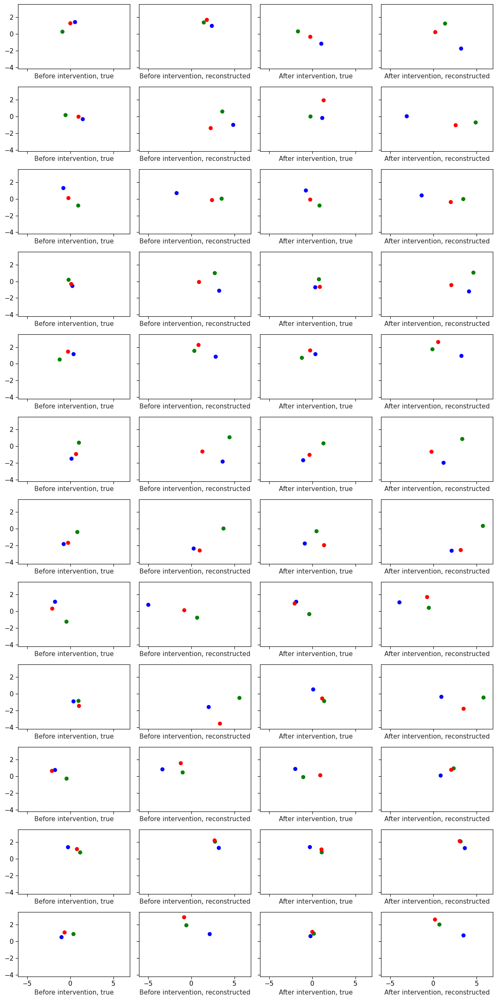

In [19]:
if "encoder" in cfg.data:
    fig, axes = plot_reconstructions(
        cfg,
        model,
        loader,
        device,
        filename=plot_dir / f"reconstructions_step_{step_name}.{format}",
        artifact_folder="reconstructions",
        save_to_mlflow=save_to_mlflow,
        encode_to_causal=True,
    )
else:
    fig, axes = None, None
fig

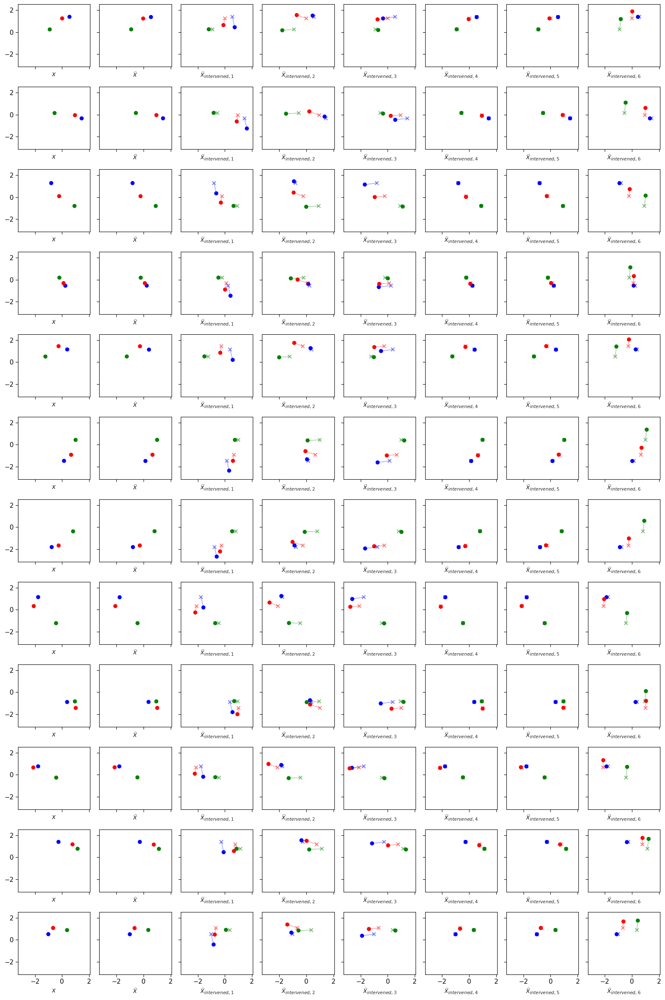

In [20]:
if "encoder" in cfg.data:
    fig, axes = plot_counterfactuals(
        cfg,
        model,
        loader,
        device,
        filename=plot_dir / f"counterfactuals_step_{step_name}.{format}",
        artifact_folder="counterfactuals",
        save_to_mlflow=save_to_mlflow,
    )
else:
    fig, axes = None, None
fig

### Solution functions

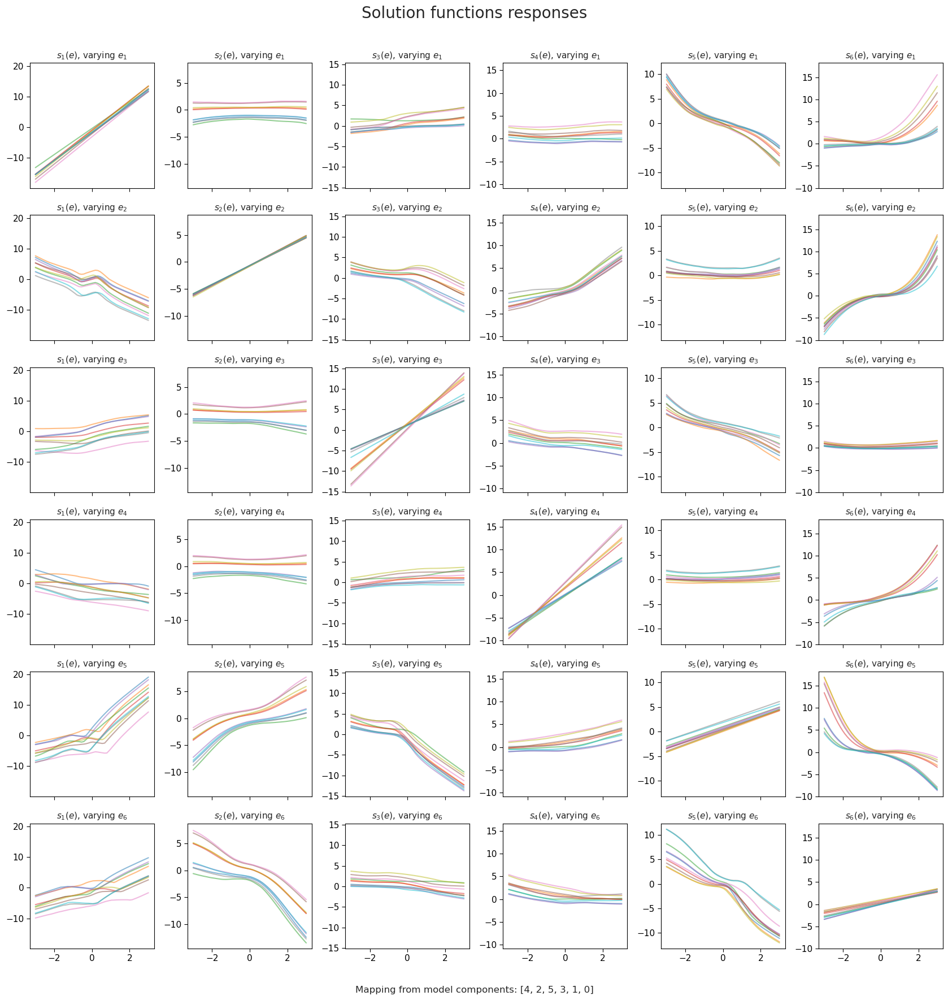

In [130]:
fig, axes = plot_solution_function_responses(
    cfg,
    model,
    loader,
    MAP_interventions,
    device,
    filename=plot_dir / f"solution_function_responses_step_{step_name}.{format}",
    artifact_folder="solution_function_responses",
    save_to_mlflow=save_to_mlflow,
)
fig

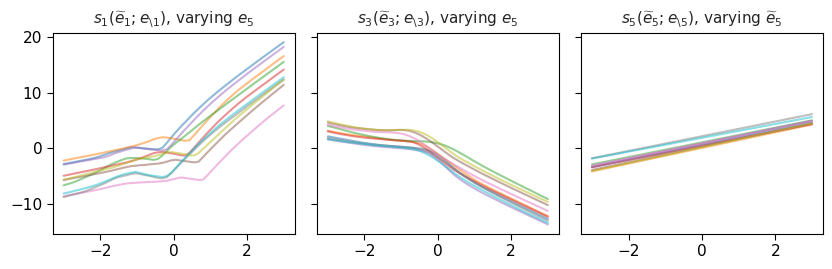

In [40]:
component_rows_to_plot = [4]
component_cols_to_plot = [0, 2, 4]
fig, axes = plot_solution_function_responses(
    cfg,
    model,
    loader,
    MAP_interventions,
    device,
    artifact_folder="solution_function_responses",
    save_to_mlflow=save_to_mlflow,
    component_rows_to_plot=component_rows_to_plot,
    component_cols_to_plot=component_cols_to_plot,
    filename=plot_dir
    / f"solution_function_responses_step_{component_rows_to_plot}_{component_cols_to_plot}_{step_name}.png",
    add_title=False,
    sharey=True,
)
fig

In [22]:
implicit_graph_adjacency_matrix = generate_directed_graph_matrix(metrics, f"implicit_graph_")
plot_graph(
    cfg,
    adjacency_matrix=implicit_graph_adjacency_matrix,
    MAP_interventions=MAP_interventions,
    filename=plot_dir / f"implicit_graph_step_{step_name}.{format}",
    artifact_folder="implicit_graph",
    save_to_mlflow=save_to_mlflow,
)

### Reconstructions

/mnt/antares_raid/home/jonasb/mambaforge/envs/wscrl/lib/python3.8/site-packages/torch/nn/modules/conv.py:459: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1682343998658/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,


(<Figure size 1200x2400 with 48 Axes>,
 array([[<Axes: xlabel='Before intervention, true'>,
         <Axes: xlabel='Before intervention, reconstructed'>,
         <Axes: xlabel='After intervention, true'>,
         <Axes: xlabel='After intervention, reconstructed'>],
        [<Axes: xlabel='Before intervention, true'>,
         <Axes: xlabel='Before intervention, reconstructed'>,
         <Axes: xlabel='After intervention, true'>,
         <Axes: xlabel='After intervention, reconstructed'>],
        [<Axes: xlabel='Before intervention, true'>,
         <Axes: xlabel='Before intervention, reconstructed'>,
         <Axes: xlabel='After intervention, true'>,
         <Axes: xlabel='After intervention, reconstructed'>],
        [<Axes: xlabel='Before intervention, true'>,
         <Axes: xlabel='Before intervention, reconstructed'>,
         <Axes: xlabel='After intervention, true'>,
         <Axes: xlabel='After intervention, reconstructed'>],
        [<Axes: xlabel='Before intervention, 

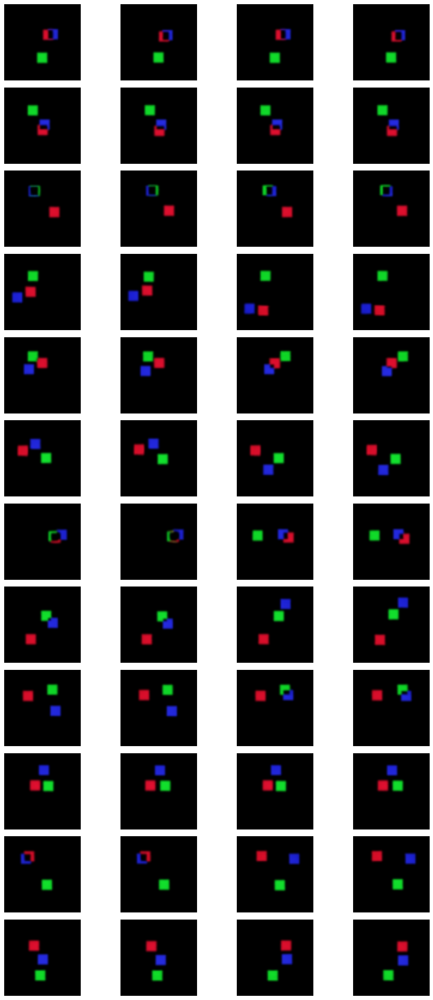

In [12]:
# from causal
plot_reconstructions(cfg, model, val_loader, device, encode_to_causal=True)

### Counterfactuals

In [118]:
MAP_components

tensor([0, 1, 2, 3, 4, 5], dtype=torch.int32)

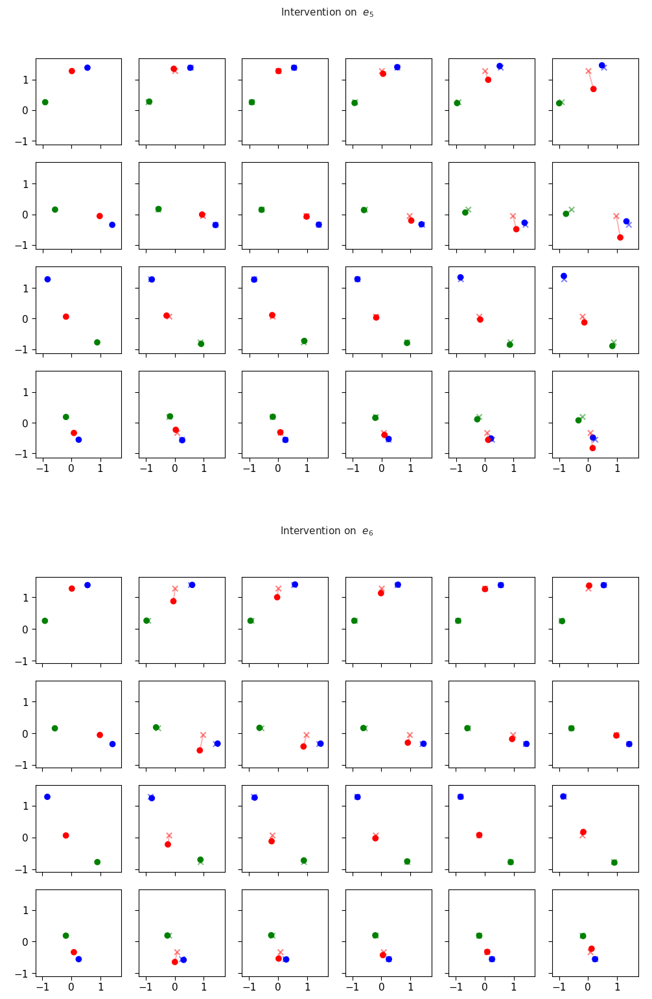

In [121]:
n_samples = 4
n_interventions = 5
intervention_scale = 1.0
plot_dir = Path(plot_dir)

plot_counterfactual_sequences(
    cfg,
    model,
    val_loader,
    device,
    n_samples=n_samples,
    n_interventions=n_interventions,
    intervention_scale=intervention_scale,
    # intervention_type="decode_causal",
    intervention_type="decode_noise",
)

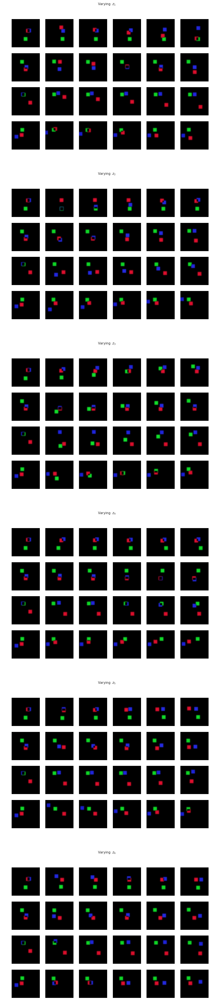

In [21]:
plot_counterfactual_sequences(
    cfg,
    model,
    val_loader,
    device,
    n_samples=n_samples,
    n_interventions=n_interventions,
    intervention_scale=intervention_scale,
    intervention_type="decode_causal",
)

In [25]:
n_samples = 4
n_interventions = 5
intervention_scale = 1.0
plot_dir = Path(plot_dir)

plot_counterfactual_sequences(
    cfg,
    model,
    val_loader,
    device,
    n_samples=n_samples,
    n_interventions=n_interventions,
    intervention_scale=intervention_scale,
    intervention_type="decode_noise_to_causal",
    filename=plot_dir
    / f"plot_counterfactual_sequences_decode_noise_to_causal_step_{step_name}.{format}",
    save_to_mlflow=False,
)
plot_counterfactual_sequences(
    cfg,
    model,
    val_loader,
    device,
    n_samples=n_samples,
    n_interventions=n_interventions,
    intervention_scale=intervention_scale,
    intervention_type="decode_noise",
    filename=plot_dir / f"plot_counterfactual_sequences_decode_noise_step_{step_name}.{format}",
    save_to_mlflow=False,
)
plot_counterfactual_sequences(
    cfg,
    model,
    val_loader,
    device,
    n_samples=n_samples,
    n_interventions=n_interventions,
    intervention_scale=intervention_scale,
    intervention_type="decode_causal",
    filename=plot_dir / f"plot_counterfactual_sequences_decode_causal_step_{step_name}.{format}",
    save_to_mlflow=False,
)

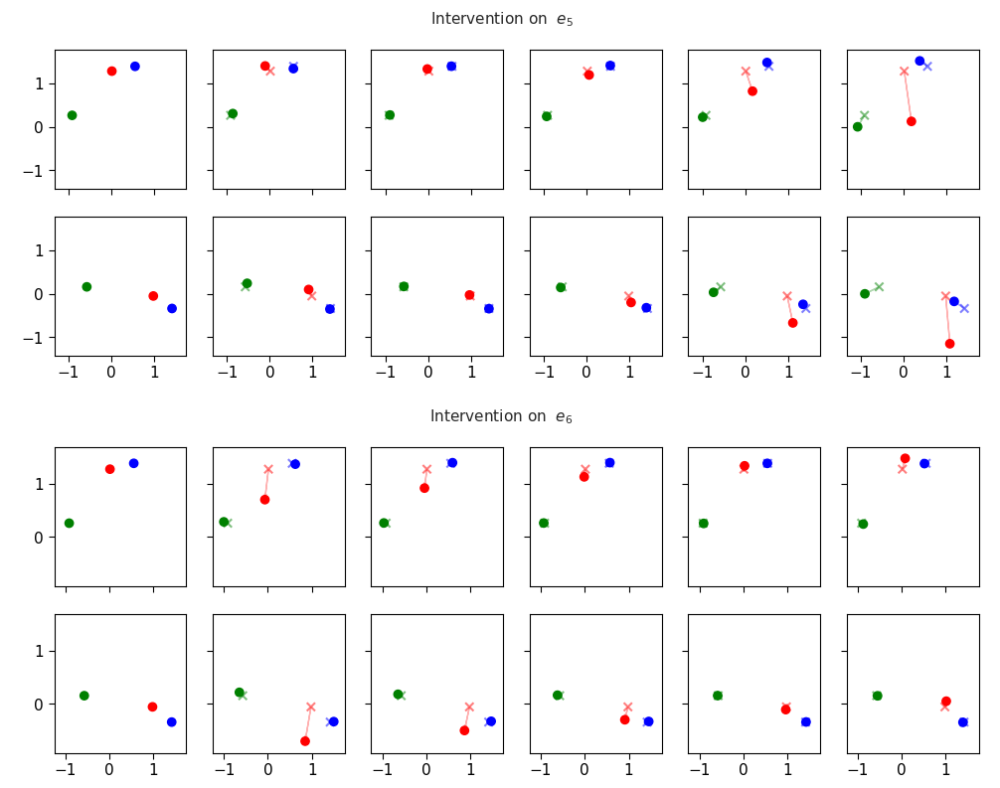

In [28]:
n_samples = 2
n_interventions = 5
intervention_scale = 5.0
plot_dir = Path(plot_dir)

fig, axes = plot_counterfactual_sequences(
    cfg,
    model,
    val_loader,
    device,
    n_samples=n_samples,
    n_interventions=n_interventions,
    intervention_scale=intervention_scale,
    # intervention_type="decode_causal",
    intervention_type="decode_noise",
    components=[4, 5],
    filename=plot_dir
    / f"plot_counterfactual_sequences_decode_noise_components_4_5_step_{step_name}.{format}",
    save_to_mlflow=False,
)
fig

### Causal reconstruction loss

In [106]:
exp_losses = []
for x1, x2, *_ in val_loader:
    x1 = x1.to(device)
    x2 = x2.to(device)

    z1_hat = model.encode_to_causal(x1, deterministic=True)
    z2_hat = model.encode_to_causal(x2, deterministic=True)

    x1_hat = model.decode_causal(z1_hat, deterministic=True)
    x2_hat = model.decode_causal(z2_hat, deterministic=True)

    mse = (x1 - x1_hat) ** 2 + (x2 - x2_hat) ** 2
    exp_losses.append(mse.mean(dim=0).cpu().numpy())
exp_losses = np.array(exp_losses).mean(axis=0)
exp_losses

array([0.07636036, 0.4434135 , 0.14496   , 0.00093177, 0.02506853,
       0.24890207], dtype=float32)

### Representations

In [78]:
def compute_representations(model, val_loader, device, MAP_components=None):
    x1s = []
    x2s = []
    true_z1s = []
    true_z2s = []
    z1s = []
    z2s = []
    intervention_labels = []
    for x1, x2, z1, z2, intervention_label, intervention_mask, e1, e2 in val_loader:
        x1, x2 = x1.to(device), x2.to(device)

        x1s.append(x1)
        x2s.append(x2)

        true_z1s.append(z1)
        true_z2s.append(z2)

        z1_hat = model.encode_to_causal(x1)
        z2_hat = model.encode_to_causal(x2)

        z1s.append(z1_hat)
        z2s.append(z2_hat)

        intervention_labels.append(intervention_label)

    x1s = torch.cat(x1s, dim=0)
    x2s = torch.cat(x2s, dim=0)
    true_z1s = torch.cat(true_z1s, dim=0)
    true_z2s = torch.cat(true_z2s, dim=0)
    z1s = torch.cat(z1s, dim=0)
    z2s = torch.cat(z2s, dim=0)
    intervention_labels = torch.cat(intervention_labels, dim=0)

    if MAP_components is not None:
        # sort by MAP_component
        z1s = z1s[:, MAP_components]
        z2s = z2s[:, MAP_components]
    return z1s, z2s, intervention_labels

In [79]:
import matplotlib.colors as mcolors
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import proj3d


class Arrow3D(FancyArrowPatch):
    def __init__(self, xs, ys, zs, *args, **kwargs):
        super().__init__((0, 0), (0, 0), *args, **kwargs)
        self._verts3d = xs, ys, zs

    def do_3d_projection(self, renderer=None):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, self.axes.M)
        self.set_positions((xs[0], ys[0]), (xs[1], ys[1]))

        return np.min(zs)


z1s, z2s, intervention_labels = compute_representations(model, val_loader, device, MAP_components)


def plot_3d_latents(
    z1,
    z2,
    intervention_labels,
    n=500,
    n_arrows_per_intervention=3,
    alpha=0.1,
    size=10,
    azim=-60,
    elev=30,
    seed=0,
    ax=None,
):
    if ax is None:
        ax = plt.figure().add_subplot(projection="3d")

    ax.scatter(z1[:, 0].cpu(), z1[:, 1].cpu(), z1[:, 2].cpu(), label="true", alpha=alpha, s=size)
    ax.set_xlabel("$z_1$")
    ax.set_ylabel("$z_2$")
    ax.set_zlabel("$z_3$")

    interventions = torch.unique(intervention_labels)

    # remove 0 intervention
    interventions = interventions[interventions != 0]
    generator = torch.Generator().manual_seed(seed)
    # color_pool = list(mcolors.BASE_COLORS.keys())
    color_pool = [
        "red",
        "green",
        "purple",
        "blue",
        "orange",
        "brown",
        "pink",
        "gray",
        "olive",
        "cyan",
    ]

    for intervention_label in interventions:
        mask = intervention_labels == intervention_label
        z1_intervention = z1[mask]
        z2_intervention = z2[mask]

        z_diff = z2_intervention - z1_intervention

        for i in range(n_arrows_per_intervention):
            idx = torch.randint(0, z1_intervention.shape[0], (1,), generator=generator)
            a = Arrow3D(
                [
                    z1_intervention[idx, 0].item(),
                    z1_intervention[idx, 0].item() + z_diff[idx, 0].item(),
                ],
                [
                    z1_intervention[idx, 1].item(),
                    z1_intervention[idx, 1].item() + z_diff[idx, 1].item(),
                ],
                [
                    z1_intervention[idx, 2].item(),
                    z1_intervention[idx, 2].item() + z_diff[idx, 2].item(),
                ],
                mutation_scale=8,
                linewidth=1,
                arrowstyle="-|>",
                color=color_pool[intervention_label - 1],
            )
            ax.add_artist(a)

    ax.view_init(azim=azim, elev=elev)


def plot_3d_projections(plot_function, arrange, *args, **kwargs):
    assert arrange in ["row", "col"]

    if arrange == "row":
        figsize = (20, 5)
    elif arrange == "col":
        figsize = (5, 20)

    fig = plt.figure(figsize=figsize)
    if arrange == "row":
        ax1 = fig.add_subplot(141, projection="3d")
        ax2 = fig.add_subplot(142, projection="3d")
        ax3 = fig.add_subplot(143, projection="3d")
        ax4 = fig.add_subplot(144, projection="3d")
    elif arrange == "col":
        ax1 = fig.add_subplot(411, projection="3d")
        ax2 = fig.add_subplot(412, projection="3d")
        ax3 = fig.add_subplot(413, projection="3d")
        ax4 = fig.add_subplot(414, projection="3d")

    plot_function(*args, ax=ax1, **kwargs)
    plot_function(*args, ax=ax2, azim=0, elev=0, **kwargs)
    plot_function(*args, ax=ax3, azim=0, elev=90, **kwargs)
    plot_function(*args, ax=ax4, azim=90, elev=0, **kwargs)

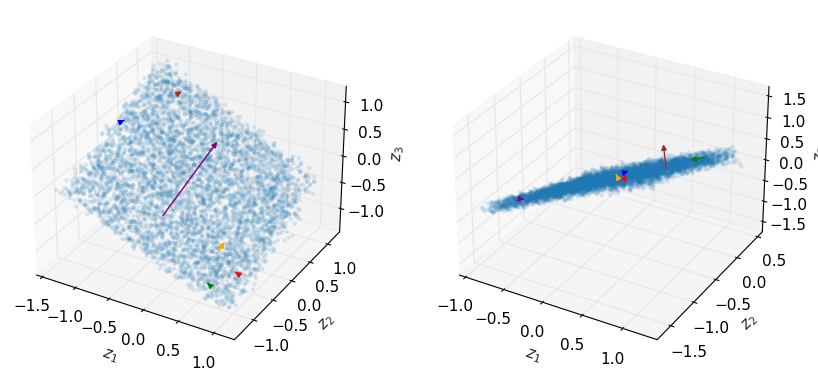

In [80]:
component_groups = [[0, 2, 4], [1, 3, 5]]

fig = plt.figure(figsize=(10, 5))

for i, components in enumerate(component_groups):
    ax = fig.add_subplot(1, 2, i + 1, projection="3d")
    plot_3d_latents(
        z1s[:, components],
        z2s[:, components],
        intervention_labels,
        n_arrows_per_intervention=1,
        size=5,
        ax=ax,
    )

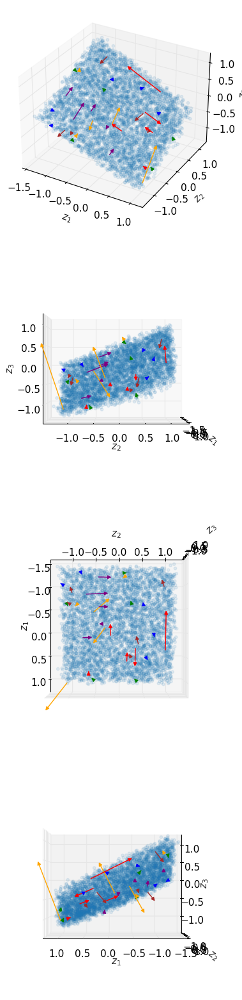

In [83]:
components = [0, 2, 4]
# components = [1, 3, 5]
plot_3d_projections(
    plot_3d_latents,
    "col",
    z1s[:, components],
    z2s[:, components],
    intervention_labels,
    n_arrows_per_intervention=5,
)

### Representation grid

In [95]:
from ws_crl.encoder.base import Inverse
from ws_crl.encoder.flow import SONEncoder


if cfg.data.encoder.type == "son":
    encoder = SONEncoder(input_features=cfg.data.dim_x, output_features=cfg.data.dim_z)
    encoder.load_state_dict(torch.load(Path(cfg.data.data_dir) / "encoder.pt"))

    decoder = Inverse(encoder)

    encoder.to(device)
    decoder.to(device)
else:
    raise NotImplementedError

x_domain = [-6, 6]
y_domain = [-6, 6]

# Sample random parents
x1, y1, x2, y2 = torch.rand(4)

# scale x1, ..., y2 to x_domain and y_domain
x1 = x1 * (x_domain[1] - x_domain[0]) + x_domain[0]
y1 = y1 * (y_domain[1] - y_domain[0]) + y_domain[0]
x2 = x2 * (x_domain[1] - x_domain[0]) + x_domain[0]
y2 = y2 * (y_domain[1] - y_domain[0]) + y_domain[0]

# Create grid for children
n = 100
x = torch.linspace(x_domain[0], x_domain[1], n)
y = torch.linspace(y_domain[0], y_domain[1], n)

xx, yy = torch.meshgrid(x, y, indexing="ij")
x3, y3 = torch.stack([xx.flatten(), yy.flatten()], dim=1).T

z_true = (
    torch.stack([x1.expand(n**2), y1.expand(n**2), x2.expand(n**2), y2.expand(n**2), x3, y3])
    .to(device)
    .T
)
# create images
x, _ = decoder(z_true)

# encode images to causal variables
z_hat = model.encode_to_causal(x)
z_hat = z_hat[:, MAP_components]

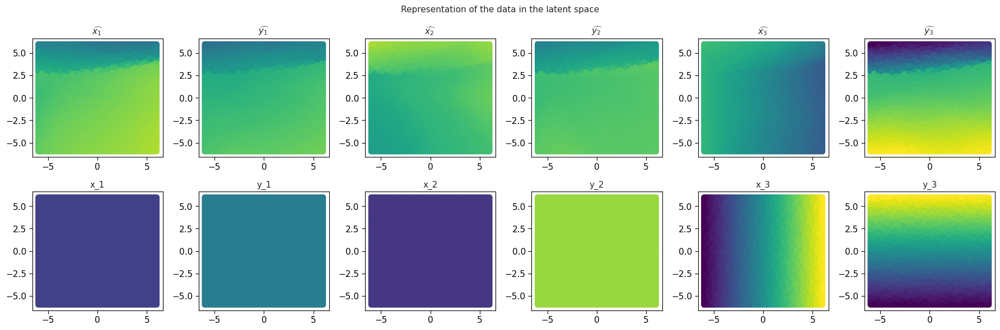

In [113]:
# import colors
import matplotlib.colors as colors

# calculate latent dim stds
z1s = []
z2s = []
for x1, x2, *_ in val_loader:
    x1, x2 = x1.to(device), x2.to(device)
    z1 = model.encode_to_causal(x1)
    z2 = model.encode_to_causal(x2)
    z1s.append(z1)
    z2s.append(z2)

z1s = torch.concat(z1s, dim=0)
z2s = torch.concat(z2s, dim=0)

z_mean = 0.5 * z1s.mean(dim=0) + 0.5 * z2s.mean(dim=0)
z_std = 0.5 * z1s.std(dim=0) + 0.5 * z2s.std(dim=0)


def plot_representations(
    z_hat,
    only_plot_children=False,
    plot_true=True,
    share_colors=True,
    normalize_components=False,
    z_mean=None,
    z_std=None,
    num_samples_per_plot=1000,
):
    if only_plot_children:
        causal_variables = [("x_3", 4), ("y_3", 5)]
    else:
        causal_variables = [
            ("x_1", 0),
            ("y_1", 1),
            ("x_2", 2),
            ("y_2", 3),
            ("x_3", 4),
            ("y_3", 5),
        ]

    if normalize_components:
        z_hat = (z_hat - z_mean) / z_std

    ncols = len(causal_variables)
    nrows = 2 if plot_true else 1
    fig, axes = plt.subplots(figsize=(ncols * 3, nrows * 3), ncols=ncols, nrows=nrows)
    fig.suptitle("Representation of the data in the latent space")

    if share_colors:
        vmin_hat = z_hat.min()
        vmax_hat = z_hat.max()
        if plot_true:
            vmin_true = z_true.min()
            vmax_true = z_true.max()
    else:
        vmin_hat = None
        vmax_hat = None
        if plot_true:
            vmin_true = None
            vmax_true = None

    if num_samples_per_plot is not None:
        indices = torch.randperm(z_hat.shape[0])[:num_samples_per_plot]

    for i, (causal_variable, component) in enumerate(causal_variables):
        if nrows > 1:
            ax = axes[0, i]
        else:
            ax = axes[i]
        color = z_hat[:, component]
        # plot = ax.scatter(
        #     xx.flatten(), yy.flatten(), c=color.cpu(), cmap="viridis", vmin=vmin_hat, vmax=vmax_hat
        # )
        plot = ax.scatter(
            xx.flatten()[indices],
            yy.flatten()[indices],
            c=color.cpu()[indices],
            cmap="viridis",
            vmin=vmin_hat,
            vmax=vmax_hat,
        )
        ax.set_title(f"$\widehat{{{causal_variable}}}$")

        if plot_true:
            ax = axes[1, i]
            color = z_true[:, component]
            ax.scatter(
                xx.flatten()[indices],
                yy.flatten()[indices],
                c=color.cpu()[indices],
                cmap="viridis",
                vmin=vmin_true,
                vmax=vmax_true,
            )
            ax.set_title(causal_variable)
    fig.tight_layout()
    return fig, axes


fig, axes = plot_representations(z_hat, z_mean=z_mean, z_std=z_std, num_samples_per_plot=10000)
# fig.savefig(Path("./figures") / f"representations_{cfg.general.run_name}.{format}")
fig.savefig(Path("./figures") / f"representations_{cfg.general.run_name}.png")

## Compare models

In [8]:
def load_results_for_dataset_name(dataset_name):
    if dataset_name in ["1d_son_small", "1d_son_equi"]:
        results_path = Path("results/runs_1d_son.csv")
    elif dataset_name in ["1d_encoding_small", "1d_encoding_small_with_equi"]:
        results_path = Path("results/runs_1d_image.csv")
    elif dataset_name in ["2d_son_small", "2d_son_equi"]:
        results_path = Path("results/runs_2d_son.csv")
    elif dataset_name in ["2d_encoding_small", "2d_encoding_small_with_equi", "2d_encoding_equi"]:
        results_path = Path("results/runs_2d_image.csv")
    elif dataset_name in ["2d_quadratic_son_equi"]:
        results_path = Path("results/runs_2d_quadratic_son.csv")
    else:
        raise ValueError(f"Results for dataset {dataset_name} not found")
    results = pd.read_csv(results_path)
    return results

In [9]:
data_dir_equi = data_dir_by_dataset["2d_son_equi"]
data_dir_small = data_dir_by_dataset["2d_son_small"]

In [10]:
def collect_models(results, model_filters):
    metrics_by_model = defaultdict(dict)
    for model_name, model_cfg in model_filters.items():
        mask = True
        for key, value in model_cfg.items():
            if key not in results.columns:
                print(f"WARNING: key {key} not in results columns")
                continue
            # select NA instances
            if isinstance(value, list):
                contains_na = pd.isna(results[key]).any()

                # filter NA from values
                value = [v for v in value if not pd.isna(v)]

                # value in values or NA
                mask &= results[key].isin(value) | (contains_na & pd.isna(results[key]))
            elif pd.isna(value):
                mask &= pd.isna(results[key])
            else:
                mask &= results[key] == value

        metrics_by_model[model_name] = results.loc[mask, :]
    return metrics_by_model


def collect_metrics_for_models(results, model_filters, metric_names):
    metrics_by_model = defaultdict(dict)
    for model_name, model_cfg in model_filters.items():
        for metric_name in metric_names:
            mask = True
            for key, value in model_cfg.items():
                if key not in results.columns:
                    print(f"WARNING: key {key} not in results columns")
                    continue
                # select NA instances
                if isinstance(value, list):
                    contains_na = pd.isna(results[key]).any()

                    # filter NA from values
                    value = [v for v in value if not pd.isna(v)]

                    # value in values or NA
                    mask &= results[key].isin(value) | (contains_na & pd.isna(results[key]))
                elif pd.isna(value):
                    mask &= pd.isna(results[key])
                else:
                    mask &= results[key] == value

            metrics_by_model[model_name][metric_name] = np.array(results.loc[mask, metric_name])
    return metrics_by_model


def get_best_models(results, target_metric_name, model_filters):
    """Get general.run_name of best model for each model type in model filters"""
    metrics_by_model = collect_models(results, model_filters)

    best_models = {}
    for model_name, metrics in metrics_by_model.items():
        best_model_idx = np.argmax(metrics[target_metric_name])
        best_model = metrics.iloc[best_model_idx]
        best_models[model_name] = best_model["Name"]
    return best_models

In [11]:
def evaluate_graph_for_model(
    results, model_filters, dataset_name, exp_name_prefix, method, true_graph
):
    print("Evaluating graphs for model runs...")
    results_by_model = collect_models(results, model_filters(data_dir_by_dataset[dataset_name]))
    run_names_by_model = {
        model_name: list(model_results.Name)
        for model_name, model_results in results_by_model.items()
    }
    run_dirs_by_model = {
        model_name: [
            get_run_dir_for_run_name(run_name, exp_name_prefix=exp_name_prefix)
            for run_name in run_names
        ]
        for model_name, run_names in run_names_by_model.items()
    }
    graph_results = {}
    for model_name, run_dirs in run_dirs_by_model.items():
        print(f"Evaluating graphs for model {model_name}...")
        try:
            correct_graphs = [
                compare_graph_with_true_graph(
                    run_dir, true_graph, method=method, implicit_threshold=0.05, from_metrics=True
                )
                for run_dir in run_dirs
            ]
            graph_results[model_name] = {
                "correct": torch.tensor(correct_graphs).sum().item(),
                "total": len(correct_graphs),
            }
        except Exception as e:
            print(f"Error for model {model_name}: {e}")
    return graph_results

In [12]:
sampling_vs_summing_model_filters = lambda data_dir: {
    "Affine (sum)": {
        "training.sample_from_intervention_posterior": False,
        "model.scm.type": "mlp",
        "data.data_dir": data_dir,
        "model.scm.n_transforms": [pd.NA, 1],
    },
    "Linear (sum)": {
        "training.sample_from_intervention_posterior": False,
        "model.scm.type": "linear",
        "data.data_dir": data_dir,
        "model.scm.n_transforms": [pd.NA, 1],
    },
    "Affine (sample)": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "mlp",
        "data.data_dir": data_dir,
        "model.scm.n_transforms": [pd.NA, 1],
    },
    "Linear (sample)": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "linear",
        "data.data_dir": data_dir,
        "model.scm.n_transforms": [pd.NA, 1],
    },
}

compare_transforms_model_filters = lambda data_dir: {
    "Affine": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "mlp",
        "model.scm.n_transforms": [pd.NA, 1],
        "model.scm.hidden_units": 100,
        "data.data_dir": data_dir,
    },
    "Linear": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "linear",
        "model.scm.n_transforms": [pd.NA, 1],
        "model.scm.hidden_units": 100,
        "data.data_dir": data_dir,
    },
    # "residual": {
    #     "training.sample_from_intervention_posterior": True,
    #     "model.scm.type": "residual_mlp",
    #     "model.scm.n_transforms": [pd.NA, 1],
    #     "model.scm.hidden_units": 100,
    #     "data.data_dir": data_dir,
    # },
    "Residual": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "residual_lipschitz_monotonic",
        "model.scm.lipschitz_const": 0.95,
        "model.scm.monotonic_constraints": "none",
        "model.scm.n_transforms": [pd.NA, 1],
        "model.scm.hidden_units": 100,
        "data.data_dir": data_dir,
    },
    "Residual Monotonic": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "residual_lipschitz_monotonic",
        "model.scm.monotonic_constraints": "context_non_mask",
        "model.scm.lipschitz_const": 0.95,
        "model.scm.n_transforms": [pd.NA, 1],
        "model.scm.hidden_units": 100,
        "data.data_dir": data_dir,
    },
}

lipschitz_const_model_filters = lambda data_dir: {
    "$\lambda = 0.2$": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "residual_lipschitz_monotonic",
        "model.scm.lipschitz_const": 0.2,
        "model.scm.monotonic_constraints": "none",
        "model.scm.n_transforms": [pd.NA, 1],
        "data.data_dir": data_dir,
    },
    "$\lambda = 0.5$": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "residual_lipschitz_monotonic",
        "model.scm.lipschitz_const": 0.5,
        "model.scm.monotonic_constraints": "none",
        "model.scm.n_transforms": [pd.NA, 1],
        "data.data_dir": data_dir,
    },
    "$\lambda = 0.9$5": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "residual_lipschitz_monotonic",
        "model.scm.lipschitz_const": 0.95,
        "model.scm.monotonic_constraints": "none",
        "model.scm.n_transforms": [pd.NA, 1],
        "data.data_dir": data_dir,
    },
    "$\lambda = 1.0$": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "residual_lipschitz_monotonic",
        "model.scm.lipschitz_const": 1.0,
        "model.scm.monotonic_constraints": "none",
        "model.scm.n_transforms": [pd.NA, 1],
        "data.data_dir": data_dir,
    },
    "$\lambda = 5.0$": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "residual_lipschitz_monotonic",
        "model.scm.lipschitz_const": 5.0,
        "model.scm.monotonic_constraints": "none",
        "model.scm.n_transforms": [pd.NA, 1],
        "data.data_dir": data_dir,
    },
}

n_transforms_model_filters = lambda data_dir, n_transforms=None: {
    "ILCM": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "mlp",
        "model.scm.n_transforms": [pd.NA, 1] if n_transforms in [None, 1] else n_transforms,
        "model.scm.hidden_units": 100,
        "data.data_dir": data_dir,
    },
    "Linear": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "linear",
        "model.scm.n_transforms": [pd.NA, 1] if n_transforms in [None, 1] else n_transforms,
        "model.scm.hidden_units": 100,
        "data.data_dir": data_dir,
    },
    "Residual": {
        "training.sample_from_intervention_posterior": True,
        "model.scm.type": "residual_lipschitz_monotonic",
        "model.scm.lipschitz_const": 0.95,
        "model.scm.monotonic_constraints": "none",
        "model.scm.n_transforms": [pd.NA, 1] if n_transforms in [None, 1] else n_transforms,
        "model.scm.hidden_units": 100,
        "data.data_dir": data_dir,
    },
}

In [13]:
def plot_metric_spread_for_dataset_and_model_filters(
    dataset_name, model_filters_for_dataset, plotname, ylim=None, x_jitter_std=0.04
):
    results = load_results_for_dataset_name(dataset_name)

    metric_names = ["eval.causal_disentanglement"]

    metrics_by_model = collect_metrics_for_models(
        results,
        model_filters_for_dataset(data_dir_by_dataset[dataset_name]),
        metric_names,
    )
    fig, ax = plot_metric_spread(
        None,
        metrics_by_model,
        metric_name="eval.causal_disentanglement",
        metric_label="Causal Disentanglement",
        plot_fails=True,
        x_jitter_std=x_jitter_std,
        filename=f"./figures/{plotname}_{dataset_name}.svg",
        ylim=ylim,
        add_legend=True,
    )
    return fig, ax

### Sampling from vs. summing over intervention posterior

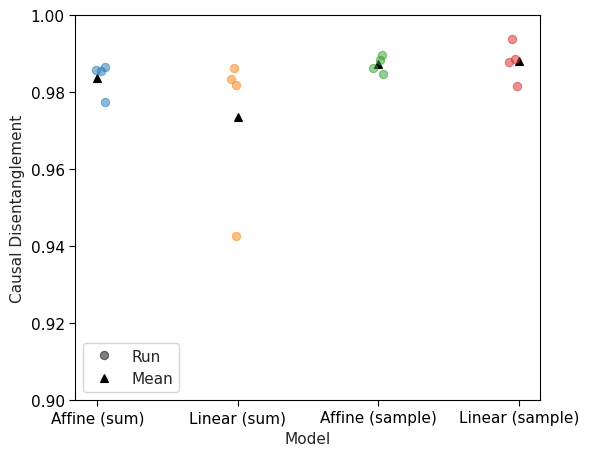

In [32]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "1d_son_small",
    sampling_vs_summing_model_filters,
    "sample_from_intervention_posterior",
    ylim=[0.90, 1],
    x_jitter_std=0.06,
)
fig

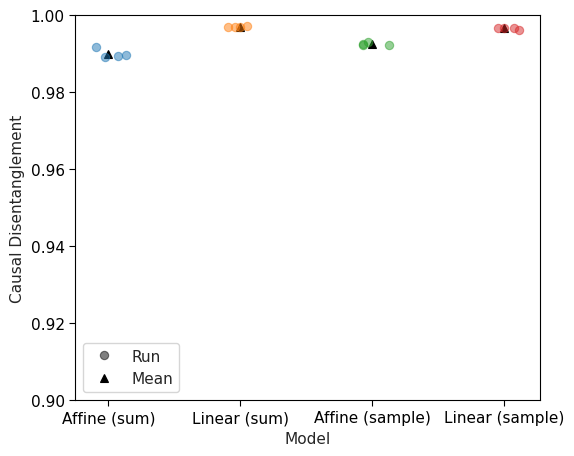

In [35]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "1d_son_equi",
    sampling_vs_summing_model_filters,
    "sample_from_intervention_posterior",
    ylim=[0.90, 1],
    x_jitter_std=0.07,
)
fig

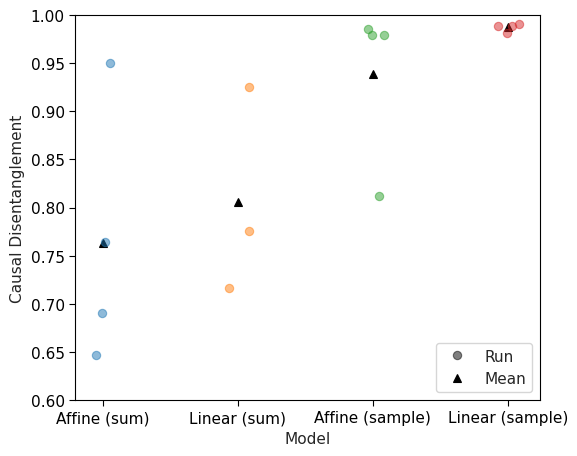

In [36]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_son_small",
    sampling_vs_summing_model_filters,
    "sample_from_intervention_posterior",
    ylim=[0.6, 1],
    x_jitter_std=0.06,
)
fig

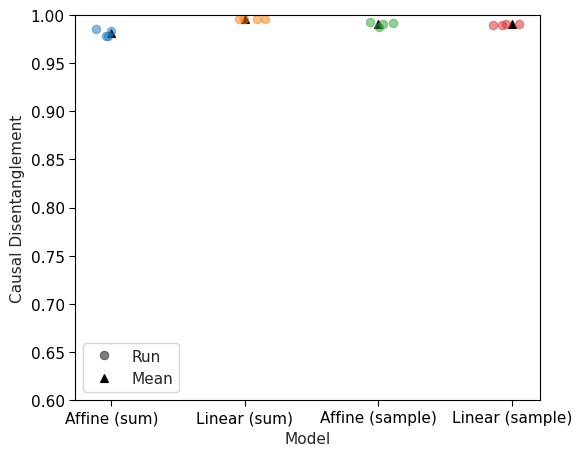

In [38]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_son_equi",
    sampling_vs_summing_model_filters,
    "sample_from_intervention_posterior",
    ylim=[0.6, 1],
    x_jitter_std=0.08,
)
fig

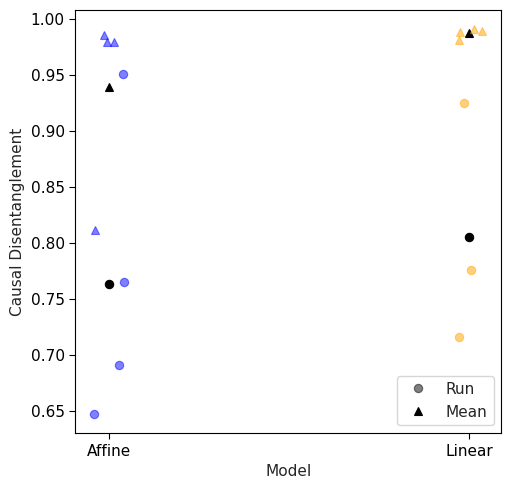

In [93]:
dataset_name = "2d_son_small"
results = load_results_for_dataset_name(dataset_name)

metric_names = ["eval.causal_disentanglement"]

colors = ["blue", "orange"]

metrics_by_model = collect_metrics_for_models(
    results,
    sampling_vs_summing_model_filters(data_dir_by_dataset[dataset_name]),
    metric_names,
)
fig, ax = plt.subplots()
fig, ax = plot_metric_spread(
    None,
    {k[:-6]: v for k, v in metrics_by_model.items() if "(sum)" in k},
    metric_name="eval.causal_disentanglement",
    metric_label="Causal Disentanglement",
    plot_fails=False,
    x_jitter_std=0.04,
    ax=ax,
    marker="o",
    colors=colors,
    # filename=f"./figures/{plotname}_{dataset_name}.svg",
)
fig, ax = plot_metric_spread(
    None,
    {k[:-9]: v for k, v in metrics_by_model.items() if "(sample)" in k},
    metric_name="eval.causal_disentanglement",
    metric_label="Causal Disentanglement",
    plot_fails=False,
    x_jitter_std=0.04,
    ax=ax,
    marker="^",
    colors=colors,
    # filename=f"./figures/{plotname}_{dataset_name}.svg",
    add_legend=False,
)

In [14]:
dataset_name = "2d_son_equi"

results = load_results_for_dataset_name(dataset_name)

metric_names = ["eval.causal_disentanglement"]

metrics_by_model = collect_metrics_for_models(
    results,
    sampling_vs_summing_model_filters(data_dir_by_dataset[dataset_name]),
    metric_names,
)

metrics_by_model

defaultdict(dict,
            {'ilcm (sum)': {'eval.causal_disentanglement': array([0.98360417, 0.98541814, 0.97870625, 0.97776372])},
             'linear ilcm (sum)': {'eval.causal_disentanglement': array([0.99587326, 0.99564596, 0.99561983, 0.99549236])},
             'ilcm (sample)': {'eval.causal_disentanglement': array([0.99307149, 0.99120642, 0.98796664, 0.99049544])},
             'linear ilcm (sample)': {'eval.causal_disentanglement': array([0.9904185 , 0.98974563, 0.99109499, 0.9894604 ])}})

In [ ]:
exp_name_prefix = "final_1dcubes_son_causal_variables"
for method in ["ENCO", "implicit"]:
    for dataset_name in ["1d_son_small", "1d_son_equi"]:
        results = load_results_for_dataset_name(dataset_name)
        graph_results = evaluate_graph_for_model(
            results,
            sampling_vs_summing_model_filters,
            dataset_name,
            exp_name_prefix,
            method,
            true_graph=cubes_1d_true_graph,
        )
        print(f"Method: {method}, Dataset: {dataset_name}")
        print(graph_results)

In [ ]:
exp_name_prefix = "final_2dcubes_son_causal_variables"
for method in ["ENCO", "implicit"]:
    for dataset_name in ["2d_son_small", "2d_son_equi"]:
        results = load_results_for_dataset_name(dataset_name)
        graph_results = evaluate_graph_for_model(
            results,
            sampling_vs_summing_model_filters,
            dataset_name,
            exp_name_prefix,
            method,
            true_graph=cubes_2d_true_graph,
        )
        print(f"Method: {method}, Dataset: {dataset_name}")
        print(graph_results)

### Compare transforms

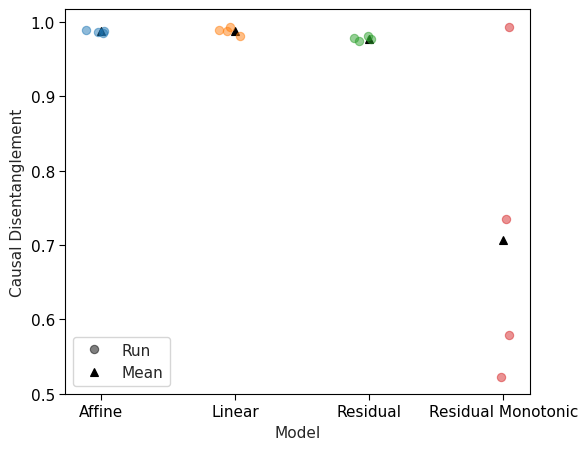

In [40]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "1d_son_small", compare_transforms_model_filters, "solution_functions", x_jitter_std=0.06
)
fig

/mnt/antares_raid/home/jonasb/mambaforge/envs/wscrl/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/mnt/antares_raid/home/jonasb/mambaforge/envs/wscrl/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


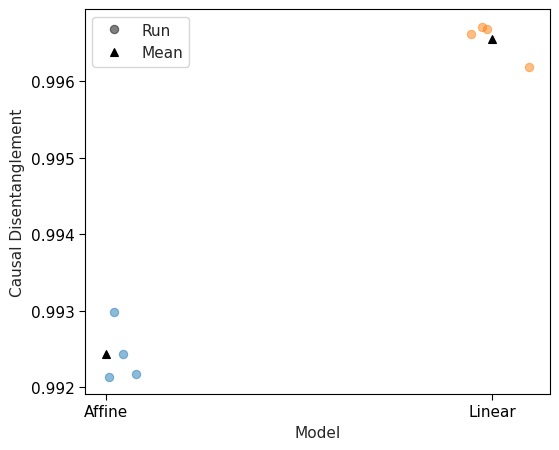

In [41]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "1d_son_equi", compare_transforms_model_filters, "solution_functions", x_jitter_std=0.07
)
fig

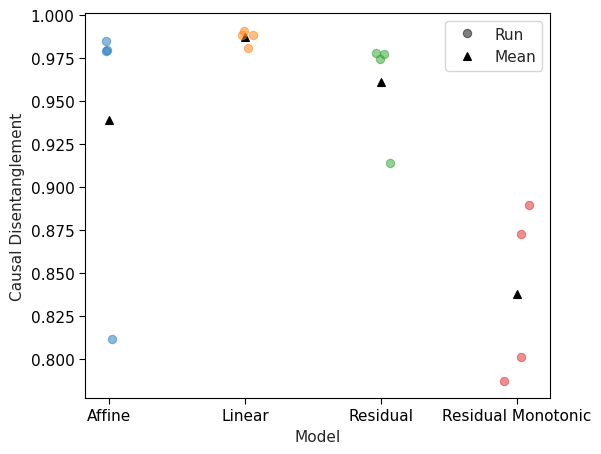

In [45]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_son_small", compare_transforms_model_filters, "solution_functions", x_jitter_std=0.05
)
fig

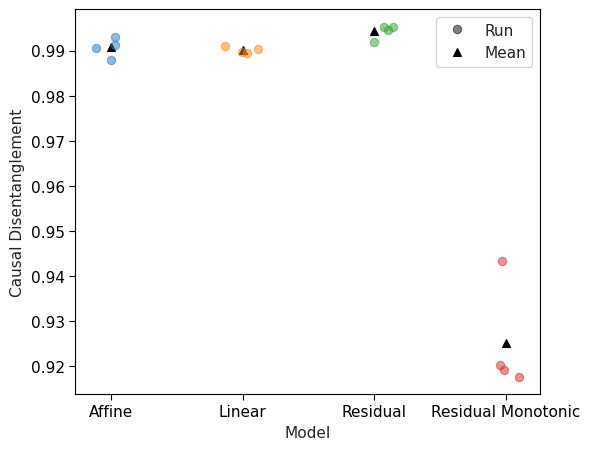

In [44]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_son_equi", compare_transforms_model_filters, "solution_functions", x_jitter_std=0.08
)
fig

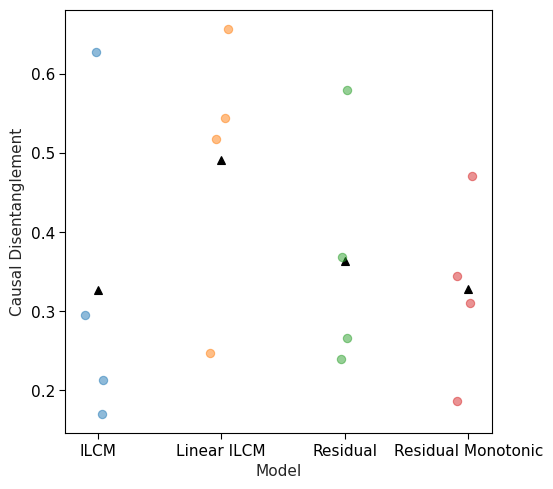

In [24]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_encoding_small", compare_transforms_model_filters, "solution_functions"
)
fig

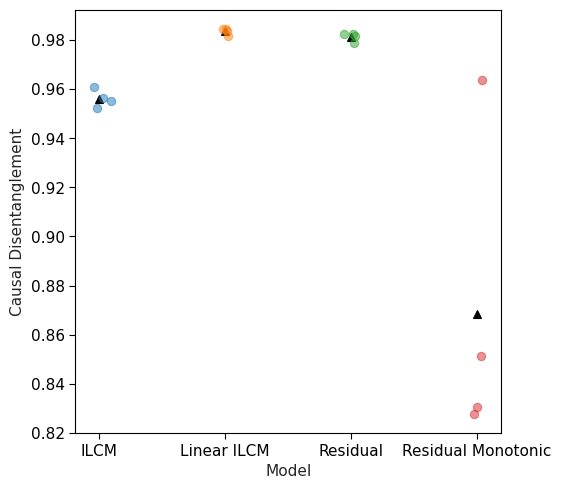

In [25]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_encoding_equi", compare_transforms_model_filters, "solution_functions"
)
fig

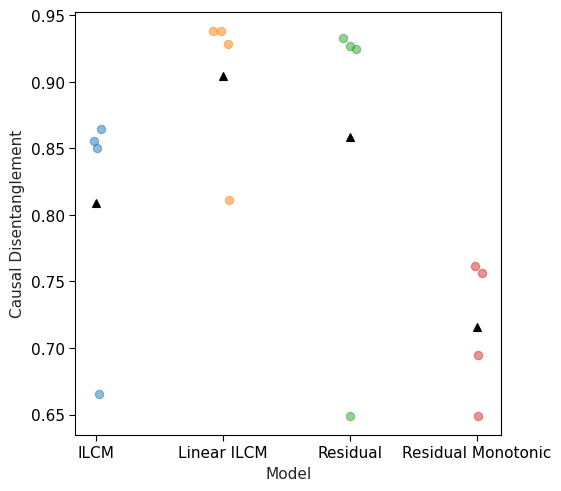

In [26]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_encoding_small_with_equi", compare_transforms_model_filters, "solution_functions"
)
fig

In [ ]:
# only use ENCO
exp_name_prefix = "final_1dcubes_son_causal_variables"
for method in ["ENCO", "implicit"]:
    for dataset_name in ["1d_son_small", "1d_son_equi"]:
        results = load_results_for_dataset_name(dataset_name)
        graph_results = evaluate_graph_for_model(
            results,
            compare_transforms_model_filters,
            dataset_name,
            exp_name_prefix,
            method,
            true_graph=cubes_1d_true_graph,
        )
        print(f"Method: {method}, Dataset: {dataset_name}")
        print(graph_results)

In [ ]:
exp_name_prefix = "final_2dcubes_image_encodings"
for method in ["ENCO", "implicit"]:
    for dataset_name in ["2d_encoding_small", "2d_encoding_equi", "2d_encoding_small_with_equi"]:
        results = load_results_for_dataset_name(dataset_name)
        graph_results = evaluate_graph_for_model(
            results,
            compare_transforms_model_filters,
            dataset_name,
            exp_name_prefix,
            method,
            true_graph=cubes_2d_true_graph,
        )
        print(f"Method: {method}, Dataset: {dataset_name}")
        print(graph_results)

### Lipschitz constant

In [46]:
metric_names = ["eval.causal_disentanglement"]

In [47]:
dataset_name = "2d_son_small"
# dataset_name = "2d_son_equi"
# dataset_name = "2d_quadratic_son_equi"

results = load_results_for_dataset_name(dataset_name)
metrics_by_model = collect_metrics_for_models(
    results,
    lipschitz_const_model_filters(data_dir_by_dataset[dataset_name]),
    metric_names,
)
metrics_by_model

defaultdict(dict,
            {'$\\lambda = 0.2$': {'eval.causal_disentanglement': array([0.87478486, 0.68013939, 0.9181429 , 0.9121538 ])},
             '$\\lambda = 0.5$': {'eval.causal_disentanglement': array([0.95024672, 0.92838113, 0.94836483, 0.95200076])},
             '$\\lambda = 0.9$5': {'eval.causal_disentanglement': array([0.97801699, 0.91407099, 0.97426257, 0.9772161 ])},
             '$\\lambda = 1.0$': {'eval.causal_disentanglement': array([0.97264856, 0.68741544, 0.97526347, 0.97450035])},
             '$\\lambda = 5.0$': {'eval.causal_disentanglement': array([0.80297516, 0.9915523 , 0.81937072])}})

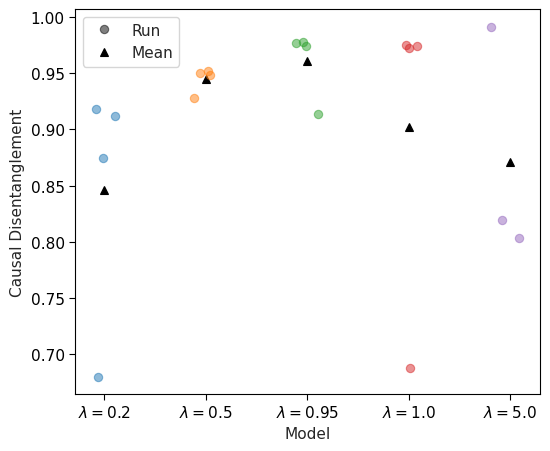

In [50]:
fig, ax = plot_metric_spread(
    None,
    metrics_by_model,
    metric_name="eval.causal_disentanglement",
    plot_fails=True,
    x_jitter_std=0.065,
    filename=f"./figures/lipschitz_const_{dataset_name}.svg",
    metric_label="Causal Disentanglement",
)
fig

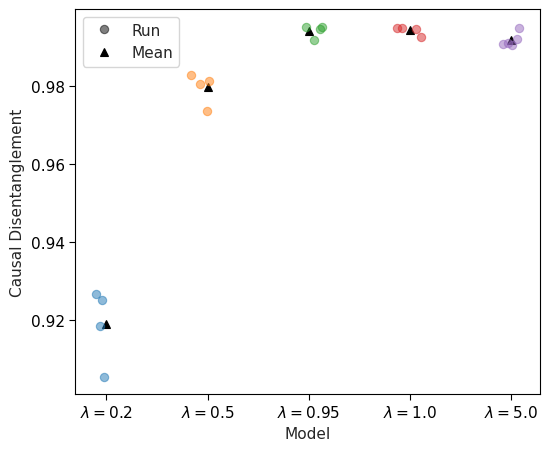

In [52]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_son_equi", lipschitz_const_model_filters, "lipschitz_const", x_jitter_std=0.09
)
fig

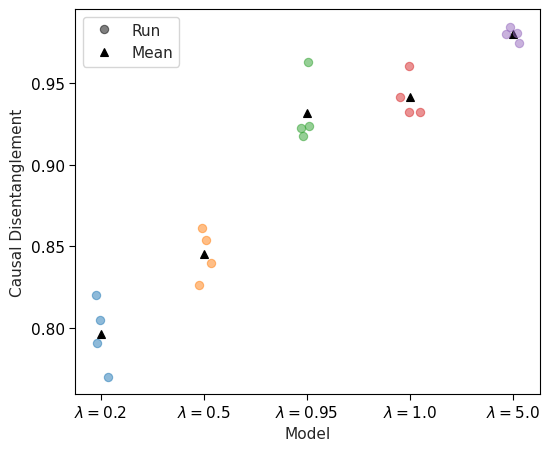

In [53]:
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_quadratic_son_equi", lipschitz_const_model_filters, "lipschitz_const", x_jitter_std=0.06
)
fig

In [ ]:
exp_name_prefix = "final_2dcubes_son_causal_variables"
for method in ["ENCO", "implicit"]:
    for dataset_name in ["2d_son_small", "2d_son_equi", "2d_quadratic_son_equi"]:
        try:
            results = load_results_for_dataset_name(dataset_name)
            graph_results = evaluate_graph_for_model(
                results,
                lipschitz_const_model_filters,
                dataset_name,
                exp_name_prefix,
                method,
                true_graph=cubes_2d_true_graph,
            )
            print(f"Method: {method}, Dataset: {dataset_name}")
            print(graph_results)
        except Exception as e:
            print(f"Error for {dataset_name}: {e}")

### Number of transforms

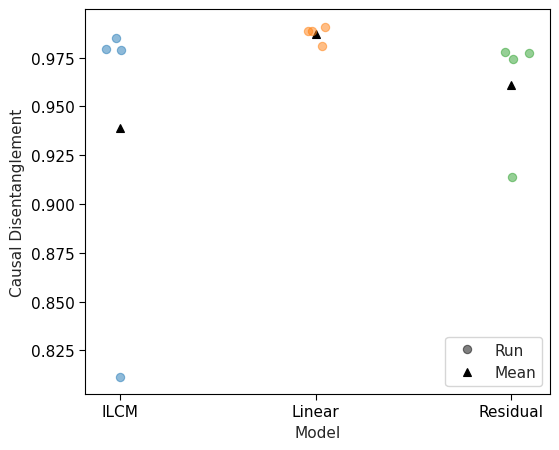

In [54]:
n_transforms = 1
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_son_small",
    lambda dataset_name: n_transforms_model_filters(dataset_name, n_transforms=n_transforms),
    f"compare_n_transforms_{n_transforms}",
)
fig

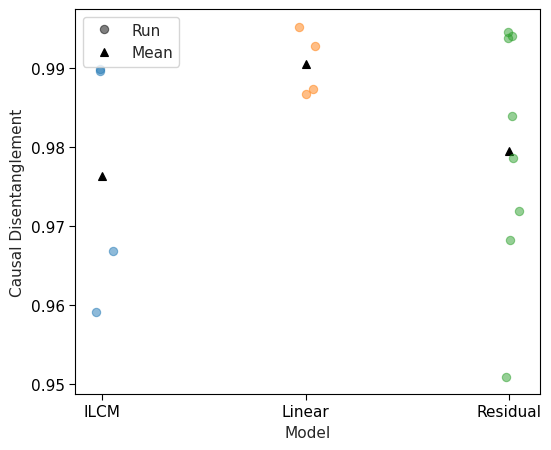

In [55]:
n_transforms = 4
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_son_small",
    lambda dataset_name: n_transforms_model_filters(dataset_name, n_transforms=n_transforms),
    f"compare_n_transforms_{n_transforms}",
)
fig

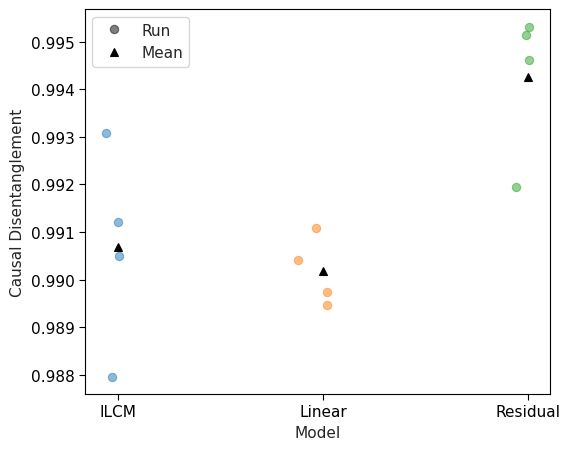

In [56]:
n_transforms = 1
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_son_equi",
    lambda dataset_name: n_transforms_model_filters(dataset_name, n_transforms=n_transforms),
    f"compare_n_transforms_{n_transforms}",
)
fig

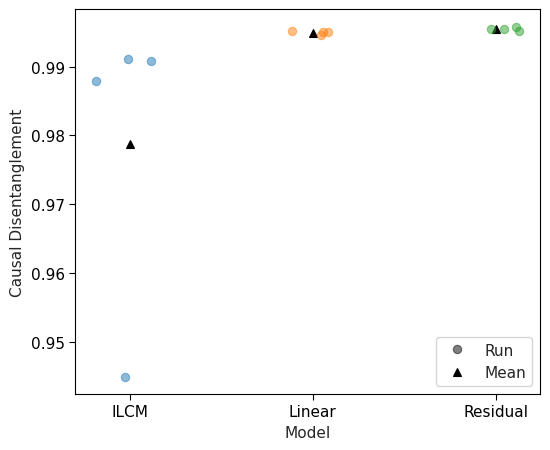

In [59]:
n_transforms = 4
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_son_equi",
    lambda dataset_name: n_transforms_model_filters(dataset_name, n_transforms=n_transforms),
    f"compare_n_transforms_{n_transforms}",
    x_jitter_std=0.1,
)
fig

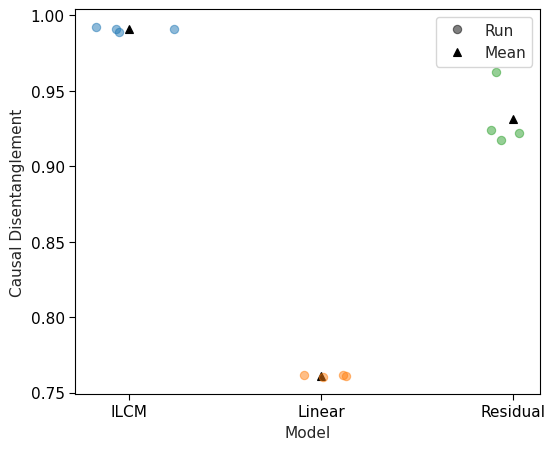

In [63]:
n_transforms = 1
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_quadratic_son_equi",
    lambda dataset_name: n_transforms_model_filters(dataset_name, n_transforms=n_transforms),
    f"compare_n_transforms_{n_transforms}",
    x_jitter_std=0.1,
)
fig

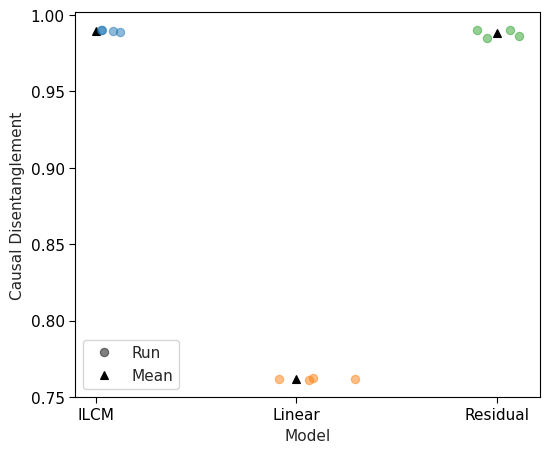

In [71]:
n_transforms = 4
fig, ax = plot_metric_spread_for_dataset_and_model_filters(
    "2d_quadratic_son_equi",
    lambda dataset_name: n_transforms_model_filters(dataset_name, n_transforms=n_transforms),
    f"compare_n_transforms_{n_transforms}",
    x_jitter_std=0.1,
)
fig

In [80]:
dataset_name = "2d_quadratic_son_equi"
results = load_results_for_dataset_name(dataset_name)

n_transforms = 4

metric_names = ["eval.causal_disentanglement"]

metrics_by_model = collect_metrics_for_models(
    results,
    n_transforms_model_filters(data_dir_by_dataset[dataset_name], n_transforms=n_transforms),
    metric_names,
)
metrics_by_model

defaultdict(dict,
            {'ilcm': {'eval.causal_disentanglement': array([0.98896614, 0.99007211, 0.98988072, 0.99011878])},
             'linear ilcm': {'eval.causal_disentanglement': array([0.76266529, 0.76139187, 0.76203976, 0.76189189])},
             'residual lipschitz': {'eval.causal_disentanglement': array([0.98612559, 0.99050145, 0.98532496, 0.99058018])}})

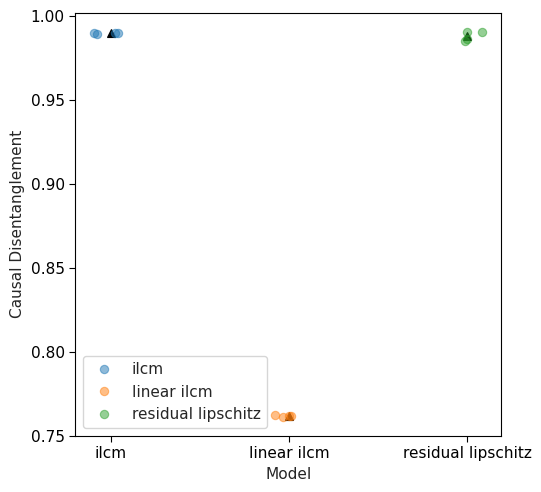

In [81]:
fig, ax = plot_metric_spread(
    None,
    metrics_by_model,
    metric_name="eval.causal_disentanglement",
    metric_label="Causal Disentanglement",
    plot_fails=True,
    x_jitter_std=0.04,
    filename=f"./figures/compare_n_transforms_{n_transforms}_{dataset_name}.svg",
)
fig

In [ ]:
n_transforms = 4
exp_name_prefix = "final_2dcubes_son_causal_variables"
for method in ["ENCO", "implicit"]:
    for dataset_name in ["2d_son_small", "2d_son_equi", "2d_quadratic_son_equi"]:
        try:
            results = load_results_for_dataset_name(dataset_name)
            graph_results = evaluate_graph_for_model(
                results,
                lambda data_dir: n_transforms_model_filters(data_dir, n_transforms=n_transforms),
                dataset_name,
                exp_name_prefix,
                method,
                true_graph=cubes_2d_true_graph,
            )
            print(f"Method: {method}, Dataset: {dataset_name}")
            print(graph_results)
        except Exception as e:
            print(f"Error for {dataset_name}: {e}")

### Causal reconstructions

In [160]:
# results_path = Path("results/0.05_child_noise_final_2dcubes_son_causal_variables.csv")
# results_path = Path("results/runs_son.csv")
# dataset_name = "2d_son_encodings_small"
# results = load_results_for_dataset_name(dataset_name)


datasets = ["2d_son_equi"]
results_path = Path("results/runs_2d_son.csv")

# datasets = ["2d_encoding_equi"]
# results_path = Path("results/runs_2d_image.csv")

results = load_results_for_dataset_name(datasets[0])
results

,Start Time,Duration,Run ID,Name,Source Type,Source Name,User,Status,data.child_intervention_labels,data.data_dir,...,val.noise_importance_matrix_5_5,val.noise_informativeness_test,val.noise_informativeness_train,val.solution_std_0,val.solution_std_1,val.solution_std_2,val.solution_std_3,val.solution_std_4,val.solution_std_5,val.z_regularization
0,2024-07-18 16:17:00,1.4h,5081854fdfb14220ad4dd8898b252b44,marvelous-koi-669,LOCAL,experiments/cubes_2d.py,jonasb,FINISHED,"[5, 6]",/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equisca...,...,1.375713e-05,0.016355,0.009952,7206.736854,9406.284764,13059.299805,13425.317122,259887.022791,125529.455812,2.133039
1,2024-07-15 15:40:55,2.0h,4b8b61dcaeb94db5b497f2cfb8ec6595,beautiful-ape-545,LOCAL,experiments/cubes_2d.py,jonasb,FINISHED,"[5, 6]",/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equisca...,...,8.853131e-08,0.000034,0.000025,0.155620,0.143490,0.141168,0.193265,0.144587,0.160212,0.226816
2,2024-07-15 13:38:55,2.0h,8d26fa8da0cb4a29986034fff3a285e1,agreeable-skunk-674,LOCAL,experiments/cubes_2d.py,jonasb,FINISHED,"[5, 6]",/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equisca...,...,9.999977e-01,0.000032,0.000023,0.165984,0.166867,0.131484,0.158064,0.131604,0.190236,0.357165
3,2024-07-15 11:36:42,2.0h,f300a649fa1e467987ccfa5be33a254e,whimsical-frog-607,LOCAL,experiments/cubes_2d.py,jonasb,FINISHED,"[5, 6]",/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equisca...,...,5.570712e-07,0.000037,0.000026,0.148063,0.200899,0.151430,0.177256,0.196393,0.148543,0.573787
4,2024-07-15 09:29:42,2.1h,2a5cea09809447a484ce3a5f7aa321bc,adaptable-jay-460,LOCAL,experiments/cubes_2d.py,jonasb,FINISHED,"[5, 6]",/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equisca...,...,3.409012e-07,0.000035,0.000025,0.162551,0.132809,0.169167,0.137602,0.193660,0.149349,0.398843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138,2024-05-29 04:13:52,1.1h,d4604ae523414fda9db0880ad44bb886,selective-conch-951,LOCAL,experiments/cubes_2d.py,jonasb,FINISHED,"[5, 6]",/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equisca...,...,1.801405e-05,0.006091,0.003594,0.200188,0.200033,0.200058,0.200024,0.200022,0.200029,0.583492
139,2024-05-29 02:38:37,1.6h,85b97c8a33f14f538914947b8a489fcd,luxuriant-fish-118,LOCAL,experiments/cubes_2d.py,jonasb,FINISHED,"[5, 6]",/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equisca...,...,4.648748e-05,0.018003,0.012706,1.844079,0.698315,0.592712,0.394997,0.437611,0.412163,3.210175
140,2024-05-29 01:19:43,1.3h,8e201669464145cd936d803564c3c135,kindly-snail-330,LOCAL,experiments/cubes_2d.py,jonasb,FINISHED,"[5, 6]",/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equisca...,...,2.914860e-05,0.009178,0.005427,0.200036,0.202340,0.200075,0.200036,0.200069,0.200079,0.225292
141,2024-05-28 23:49:27,1.5h,c16cc98a6e3049108773fb7746b96747,nosy-wren-383,LOCAL,experiments/cubes_2d.py,jonasb,FINISHED,"[5, 6]",/mnt/raid/ni/jonasb/wscrl/data/2dcubes_equisca...,...,2.230657e-04,0.039390,0.024853,0.972199,0.478248,0.449744,0.436028,1.303348,0.698666,3.427110


In [118]:
def compute_reconstruction_loss(cfg, model, loader, device, encode_to_causal=True):
    if not model:
        print(f"Model for {exp_name} not found")
        return np.ones(cfg.model.dim_x) * -1
    if "residual" in cfg.model.scm.type and (
        "lipschitz_const" not in cfg.model.scm or cfg.model.scm.lipschitz_const >= 1
    ):
        print(f"Skipping {exp_name}")
        return np.ones(cfg.model.dim_x) * -1
    exp_losses = []
    for x1, x2, *_ in loader:
        x1 = x1.to(device)
        x2 = x2.to(device)

        if encode_to_causal:
            z1_hat = model.encode_to_causal(x1, deterministic=True)
            z2_hat = model.encode_to_causal(x2, deterministic=True)

            x1_hat = model.decode_causal(z1_hat, deterministic=True)
            x2_hat = model.decode_causal(z2_hat, deterministic=True)
        else:
            e1_hat = model.encode_to_noise(x1, deterministic=True)
            e2_hat = model.encode_to_noise(x2, deterministic=True)

            x1_hat = model.decode_noise(e1_hat, deterministic=True)
            x2_hat = model.decode_noise(e2_hat, deterministic=True)

        mse = (x1 - x1_hat) ** 2 + (x2 - x2_hat) ** 2
        exp_losses.append(mse.mean(dim=0).cpu().numpy())
    exp_losses = np.array(exp_losses).mean(axis=0)
    return exp_losses

In [119]:
def compute_reconstruction_losses_for_models(results, model_filters, encode_to_causal):
    exp_name = results["general.exp_name"][0]
    assert all(results["general.exp_name"] == exp_name)

    results_by_model = collect_models(results, model_filters)

    reconstruction_losses_by_model = {}
    for model_name, model_results in results_by_model.items():
        print(f"Computing reconstruction losses for {model_name}")
        run_names = model_results.Name
        model_run_dirs = [
            get_run_dir_for_run_name(run_name, exp_name_prefix=exp_name) for run_name in run_names
        ]

        reconstruction_losses = []
        for i, run_dir in enumerate(model_run_dirs):
            print(f"Computing reconstruction loss for {run_dir.name} ({i+1}/{len(model_run_dirs)})")
            model, cfg, train_loader, val_loader, device = setup_evaluation(run_dir.name, step=None)
            exp_losses = compute_reconstruction_loss(
                cfg, model, val_loader, device, encode_to_causal=encode_to_causal
            )
            reconstruction_losses.append(exp_losses)
            print(f"Reconstruction losses: {exp_losses.mean()}")

        reconstruction_losses_by_model[model_name] = np.array(reconstruction_losses)
    return reconstruction_losses_by_model

In [ ]:
for dataset in datasets:
    for encode_to_causal in [True, False]:
        print(f"Computing reconstruction losses for {dataset}")
        data_dir = data_dir_by_dataset[dataset]
        model_filters = compare_transforms_model_filters(data_dir)
        reconstruction_losses_by_model = compute_reconstruction_losses_for_models(
            results, model_filters, encode_to_causal
        )
        for model_name, reconstruction_losses in reconstruction_losses_by_model.items():
            # save
            outfile = Path(
                f"results/reconstruction_losses/{'causal' if encode_to_causal else 'noise'}_{model_name}_{dataset}.npy"
            )
            outfile.parent.mkdir(parents=True, exist_ok=True)
            np.save(outfile, reconstruction_losses)

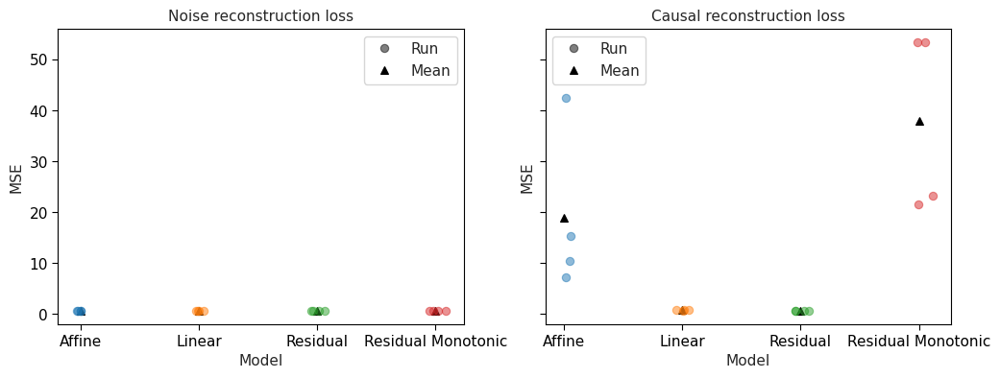

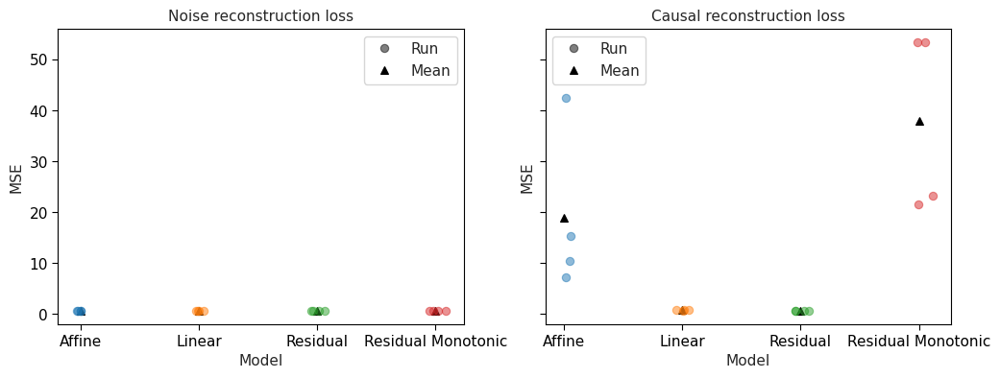

In [164]:
dataset = "2d_encoding_equi"
# dataset = "2d_son_equi"
latent_types = ["noise", "causal"]
fig, axes = plt.subplots(ncols=len(latent_types), figsize=(12, 4), sharey=True)

for i, latent_type in enumerate(latent_types):
    if len(latent_types) > 1:
        ax = axes[i]
    else:
        ax = axes
    data_dir = data_dir_by_dataset[dataset]
    model_filters = compare_transforms_model_filters(data_dir)

    exp_name = results["general.exp_name"][0]
    assert all(results["general.exp_name"] == exp_name)

    results_by_model = collect_models(results, model_filters)
    for model_name, model_results in results_by_model.items():

        filename = Path(f"results/reconstruction_losses/{latent_type}_{model_name}_{dataset}.npy")
        reconstruction_losses = np.load(filename)
        model_results["reconstruction_loss"] = reconstruction_losses.sum(axis=1).tolist()

    results_by_model = {
        k: v for k, v in results_by_model.items() if (v["reconstruction_loss"] > 0).any()
    }
    results_by_model = {k: v for k, v in results_by_model.items() if not v.empty}

    _, ax = plot_metric_spread(
        None,
        results_by_model,
        metric_name="reconstruction_loss",
        metric_label=f"MSE",
        plot_fails=True,
        x_jitter_std=0.04,
        # filename="./figures/reconstruction_loss.svg",
        ax=ax,
    )

    ax.set_title(f"{latent_type.title()} reconstruction loss")
fig.savefig(f"./figures/noise_vs_causal_reconstruction_loss_{dataset}.svg")
fig

# x-spread depend on std in y
# seaborn strip plot

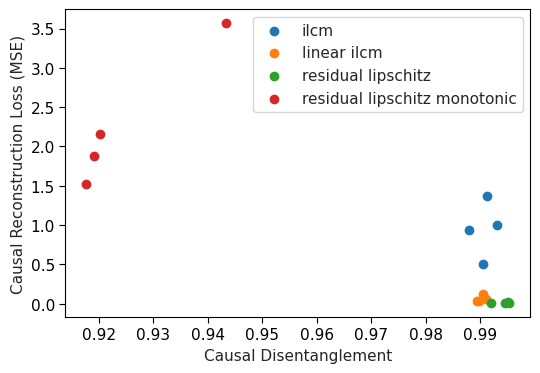

In [134]:
# results_path = Path("results/runs_image.csv")
# results = pd.read_csv(results_path)
latent_type = "causal"

# dataset = "encoding_equi"
dataset = datasets[0]

data_dir = data_dir_by_dataset[dataset]
model_filters = compare_transforms_model_filters(data_dir)

results_by_model = collect_models(results, model_filters)
for model_name, model_results in results_by_model.items():
    filename = Path(f"results/reconstruction_losses/{latent_type}_{model_name}_{dataset}.npy")
    reconstruction_losses = np.load(filename)
    model_results["reconstruction_loss"] = reconstruction_losses.sum(axis=1)

results_by_model = {
    k: v for k, v in results_by_model.items() if (v["reconstruction_loss"] > 0).any()
}
results_by_model = {k: v for k, v in results_by_model.items() if not v.empty}

fig, ax = plt.subplots(figsize=(6, 4))

for model_name, model_results in results_by_model.items():
    ax.scatter(
        model_results["eval.causal_disentanglement"],
        model_results["reconstruction_loss"],
        label=model_name,
    )
ax.set_xlabel("Causal Disentanglement")
ax.set_ylabel(f"{latent_type.title()} Reconstruction Loss (MSE)")
ax.legend()

fig.savefig(f"./figures/causal_disentanglement_vs_reconstruction_loss_{dataset}.svg")

In [26]:
filename = Path(f"results/reconstruction_losses/causal_ilcm_equi.npy")
reconstruction_losses = np.load(filename)

### OOD

In [14]:
dataset_name = "2d_son_equi"
results = load_results_for_dataset_name(dataset_name)

model_filters = compare_transforms_model_filters(data_dir_by_dataset[dataset_name])
# model_filters = sampling_vs_summing_model_filters_for_data_dir(data_dir_equi)
best_models_names = get_best_models(results, "eval.causal_disentanglement", model_filters)
best_models_names

{'Affine': 'adorable-vole-511',
 'Linear': 'capable-bee-944',
 'Residual': 'enchanting-zebra-965',
 'Residual Monotonic': 'dashing-flea-40'}

In [15]:
run_name = best_models_names["Affine"]
exp_name = get_run_dir_for_run_name(run_name, exp_name_prefix="final_2dcubes_son_causal_variables")
model, cfg, train_loader, val_loader, device = setup_evaluation(exp_name, step=None)

Finding adorable-vole-511...


In [16]:
if cfg.data.data_dir == data_dir_by_dataset["2d_son_equi"]:
    NOISE_SCALE1 = 4
    NOISE_SCALE2 = 4
    NOISE_SCALE3 = 4
elif cfg.data.data_dir == data_dir_by_dataset["2d_son_small"]:
    NOISE_SCALE1 = 6
    NOISE_SCALE2 = 6
    NOISE_SCALE3 = 0.3
else:
    raise NotImplementedError

In [17]:
from ws_crl.encoder.base import Inverse
from ws_crl.encoder.flow import SONEncoder
from ws_crl.metrics import compute_dci

encoder = SONEncoder(input_features=cfg.data.dim_x, output_features=cfg.data.dim_z)
encoder.load_state_dict(torch.load(Path(cfg.data.data_dir) / "encoder.pt"))

decoder = Inverse(encoder)

encoder.to(device)
decoder.to(device)


def scm(
    e,
    WEIGHT1=1.0,
    WEIGHT2=0.7,
    NOISE_SCALE1=NOISE_SCALE1,
    NOISE_SCALE2=NOISE_SCALE2,
    NOISE_SCALE3=NOISE_SCALE3,
):
    # def scm(e, WEIGHT1=1, WEIGHT2=0.7, NOISE_SCALE1=4, NOISE_SCALE2=4, NOISE_SCALE3=4):
    pos_x1 = e[:, 0] * NOISE_SCALE1
    pos_y1 = e[:, 1] * NOISE_SCALE1
    pos_x2 = e[:, 2] * NOISE_SCALE2
    pos_y2 = e[:, 3] * NOISE_SCALE2
    pos_x3 = (pos_x1 * WEIGHT1 + pos_x2 * WEIGHT2) / (WEIGHT1 + WEIGHT2) + e[:, 4] * NOISE_SCALE3
    pos_y3 = (pos_y1 * WEIGHT1 + pos_y2 * WEIGHT2) / (WEIGHT1 + WEIGHT2) + e[:, 5] * NOISE_SCALE3
    return torch.stack([pos_x1, pos_y1, pos_x2, pos_y2, pos_x3, pos_y3], dim=1)


def generate_data(n, ood_scale):
    e = (torch.rand((n, 6)) * 2 - 1) * ood_scale
    z = scm(e).to(device)
    x, _ = decoder(z)

    # normalize x
    x1_mean = torch.tensor(cfg.data.x1_mean)
    x1_std = torch.tensor(cfg.data.x1_std)
    x2_mean = torch.tensor(cfg.data.x2_mean)
    x2_std = torch.tensor(cfg.data.x2_std)

    x_mean = (x1_mean + x2_mean) / 2
    x_std = (x1_std + x2_std) / 2

    x = (x - x_mean.to(x.device)) / x_std.to(x.device)

    # rotate all z
    # x = torch.matmul(z, R)
    return e, z, x


def compute_dci_for_ood_scale(model, ood_scale, n_train=1000, n_val=1000, causal=True):
    # Generate new data points
    true_e_ood_train, true_z_ood_train, x_ood_train = generate_data(
        n_train,
        ood_scale,
    )
    true_e_ood, true_z_ood, x_ood = generate_data(
        n_val,
        ood_scale,
    )

    # Encode the data points
    model_z_ood_train = model.encode_to_causal(x_ood_train, deterministic=True)
    model_z_ood = model.encode_to_causal(x_ood, deterministic=True)

    model_e_ood_train = model.encode_to_noise(x_ood_train, deterministic=True)
    model_e_ood = model.encode_to_noise(x_ood, deterministic=True)

    if causal:
        dci_metrics = compute_dci(
            true_z_ood_train,
            model_z_ood_train,
            true_z_ood,
            model_z_ood,
            return_full_importance_matrix=True,
        )
    else:
        dci_metrics = compute_dci(
            true_e_ood_train,
            model_e_ood_train,
            true_e_ood,
            model_e_ood,
            return_full_importance_matrix=True,
        )
    return dci_metrics

In [ ]:
ood_results = {}
causal = True

exp_name = results["general.exp_name"][0]
assert all(results["general.exp_name"] == exp_name)

for model_name, run_name in best_models_names.items():
    print(f"Computing for {model_name}...")
    run_dir = get_run_dir_for_run_name(run_name, exp_name_prefix=exp_name)
    model, cfg, train_loader, val_loader, device = setup_evaluation(run_dir.name, step=None)
    model_results = []
    for ood_scale in np.linspace(0.5, 4.0, 25):
        dci_metrics = compute_dci_for_ood_scale(model, ood_scale, causal=causal)
        model_results.append((ood_scale, dci_metrics["disentanglement"]))
    ood_results[model_name] = model_results
ood_results

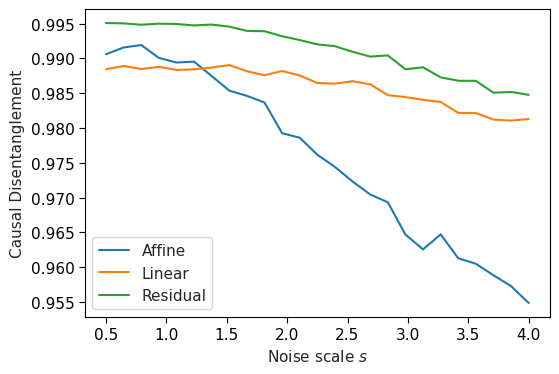

In [19]:
fig, ax = plt.subplots(figsize=(6, 4))
models_to_plot = ["Affine", "Linear", "Residual"]
# models_to_plot = None
ood_results_to_plot = (
    {k: v for k, v in ood_results.items() if k in models_to_plot} if models_to_plot else ood_results
)
for model_name, model_results in ood_results_to_plot.items():
    ax.plot(*zip(*model_results), label=model_name)
ax.set_xlabel("Noise scale $s$")
ax.set_ylabel("Causal Disentanglement")
ax.legend()

fig.savefig(f"./figures/ood_solution_functions_equi_{dataset_name}.svg")

#### OOD examples

In [51]:
dataset_name = "2d_son_equi"
results = load_results_for_dataset_name(dataset_name)

model_filters = compare_transforms_model_filters(data_dir_by_dataset[dataset_name])
# model_filters = sampling_vs_summing_model_filters_for_data_dir(data_dir_equi)
best_models_names = get_best_models(results, "eval.causal_disentanglement", model_filters)
best_models_names

{'ILCM': 'adorable-vole-511',
 'Linear ILCM': 'capable-bee-944',
 'Residual': 'enchanting-zebra-965',
 'Residual Monotonic': 'dashing-flea-40'}

In [54]:
run_dir = get_run_dir_for_run_name(
    best_models_names["ILCM"], exp_name_prefix="final_2dcubes_son_causal_variables"
)

_, data_cfg, _, val_loader, device = setup_evaluation(run_dir.name, step=None)
x1 = get_first_batch(val_loader)[0].to(device)

Finding adorable-vole-511...


Finding adorable-vole-511...
Finding capable-bee-944...
Finding enchanting-zebra-965...


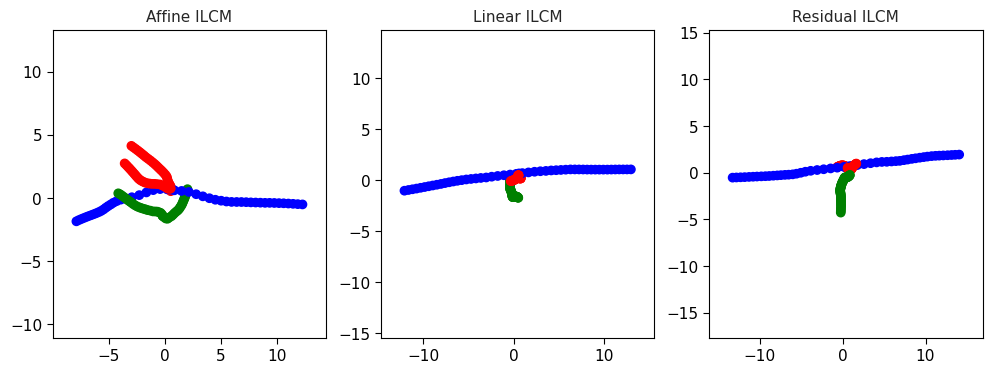

In [58]:
def plot_variation_sequence_image(
    x1, run_name, exp_name_prefix, data_cfg, device, ax=None, scale=1, title=None
):
    if ax is None:
        fig, ax = plt.subplots(figsize=(4, 4))
    else:
        fig = ax.figure

    run_dir = get_run_dir_for_run_name(run_name, exp_name_prefix=exp_name_prefix)
    model, cfg, train_loader, val_loader, _ = setup_evaluation(run_dir.name, step=None)
    model = model.to(device)

    e1 = model.encode_to_noise(x1, deterministic=True)
    z1 = model.encode_to_causal(x1, deterministic=True)

    MAP_components = compute_MAP_components(cfg, model, val_loader, device)

    z1_std = e1.std(dim=0)

    i = 0
    plot_x(data_cfg, x1[i], ax=ax)

    intervention_component = 4

    n_interventions = 50

    values = torch.linspace(
        scale * -z1_std[MAP_components[intervention_component]],
        scale * z1_std[MAP_components[intervention_component]],
        n_interventions,
    )

    for value in values:
        x1_noise, _ = intervene(
            model,
            z1,
            MAP_components[intervention_component],
            mode="fixed",
            value=value + z1[i, MAP_components[intervention_component]],
            intervention_type="decode_causal",
        )
        plot_x(data_cfg, x1_noise[i], ax=ax)

    margin = 0.1
    # Get current axis limits
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # Find the maximum range
    max_range = max(abs(xlim[1] - xlim[0]), abs(ylim[1] - ylim[0]))

    # Compute the new limits to make the ranges equal
    x_center = (xlim[0] + xlim[1]) / 2
    y_center = (ylim[0] + ylim[1]) / 2
    # new_xlim = [x_center - max_range / 2, x_center + max_range / 2]
    new_xlim = [x_center - max_range / 2 - margin, x_center + max_range / 2 + margin]
    # new_ylim = [y_center - max_range / 2, y_center + max_range / 2]
    new_ylim = [y_center - max_range / 2 - margin, y_center + max_range / 2 + margin]

    # Set the new limits
    ax.set_xlim(new_xlim)
    ax.set_ylim(new_ylim)

    if title:
        ax.set_title(title)

    return fig, ax


fig, axes = plt.subplots(figsize=(12, 4), ncols=3, nrows=1)  # , sharex=True, sharey=True)

fig, ax = plot_variation_sequence_image(
    x1,
    best_models_names["ILCM"],
    "final_2dcubes_son_causal_variables",
    data_cfg,
    device,
    ax=axes[0],
    scale=100,
    title="Affine ILCM",
)
fig, ax = plot_variation_sequence_image(
    x1,
    best_models_names["Linear ILCM"],
    # "clumsy-stork-239",
    "final_2dcubes_son_causal_variables",
    data_cfg,
    device,
    ax=axes[1],
    scale=100,
    title="Linear ILCM",
)
fig, ax = plot_variation_sequence_image(
    x1,
    best_models_names["Residual"],
    "final_2dcubes_son_causal_variables",
    data_cfg,
    device,
    ax=axes[2],
    scale=50,
    title="Residual ILCM",
)
fig.savefig(f"./figures/variation_sequence_{dataset_name}_large.svg")

In [ ]:
# compare linear with residual lipschitz

### Intervention encoder

Finding luxuriant-fish-118...
Finding bemused-rat-817...


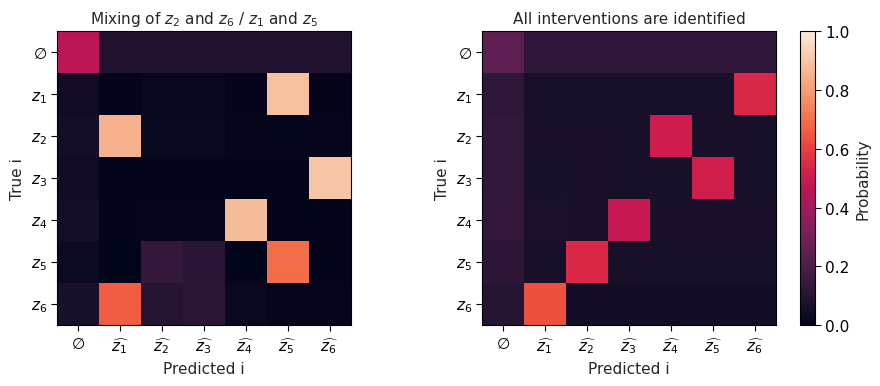

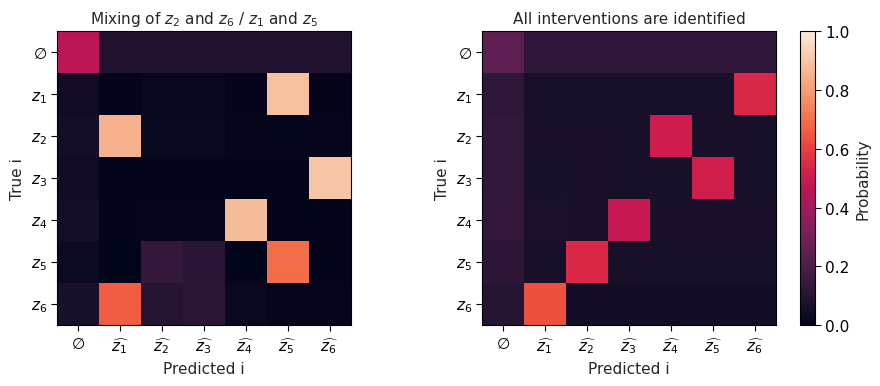

In [158]:
exp_name_prefix = "final_2dcubes_son_causal_variables"
run_names = ["luxuriant-fish-118", "bemused-rat-817"]
titles = [
    "Mixing of $z_2$ and $z_6$ / $z_1$ and $z_5$",
    "All interventions are identified",
]
step = 30000

fig, axes = plt.subplots(figsize=(10, 4), ncols=2, nrows=1)

for ax, run_name, title in zip(axes, run_names, titles):
    exp_name = get_run_dir_for_run_name(run_name=run_name, exp_name_prefix=exp_name_prefix).name

    model, cfg, train_loader, val_loader, device = setup_evaluation(exp_name, step=step)
    intervention_posterior, intervention_label = calculate_intervention_posteriors(
        cfg, model, loader, device
    )
    average_intervention_posterior = calculate_average_intervention_posterior(
        cfg, intervention_posterior, intervention_label, device=device
    )

    plot_average_intervention_posterior(
        cfg,
        average_intervention_posterior,
        save_to_mlflow=False,
        cbar=run_name == run_names[-1],
        ax=ax,
        title=title,
    )

fig.tight_layout()
fig.savefig(f"./figures/average_intervention_posterior_fail_vs_success.png")
fig

### Informativeness

In [44]:
[c for c in model_results.columns if "informative" in c]

['eval.causal_informativeness_test',
 'eval.causal_informativeness_train',
 'eval.noise_informativeness_test',
 'eval.noise_informativeness_train',
 'val.causal_informativeness_test',
 'val.causal_informativeness_train',
 'val.noise_informativeness_test',
 'val.noise_informativeness_train']

In [68]:
model_results["eval.noise_disentanglement"]

87    0.999707
88    0.999636
91    0.999828
93    0.999699
Name: eval.noise_disentanglement, dtype: float64

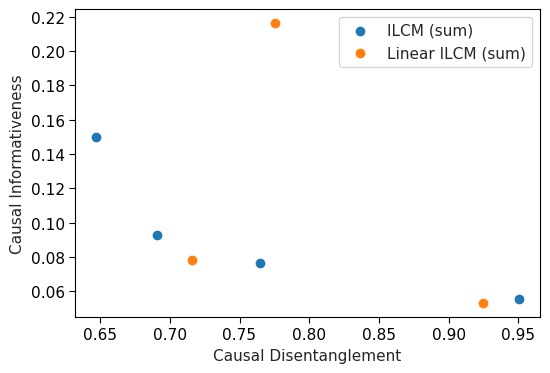

In [79]:
fig, ax = plt.subplots(figsize=(6, 4))

dataset_name = "2d_son_small"
model_filters = {
    k: v
    for k, v in sampling_vs_summing_model_filters(data_dir_by_dataset[dataset_name]).items()
    if "(sum)" in k
}
# model_filters = compare_transforms_model_filters(data_dir_by_dataset[dataset_name])
results = load_results_for_dataset_name(dataset_name)

results_by_model = collect_models(results, model_filters)

for model_name, model_results in results_by_model.items():
    ax.scatter(
        model_results["eval.causal_disentanglement"],
        model_results["eval.causal_informativeness_test"],
        label=model_name,
    )

ax.set_xlabel("Causal Disentanglement")
ax.set_ylabel("Causal Informativeness")
ax.legend()

fig.savefig(f"./figures/causal_disentanglement_vs_informativeness_{dataset_name}.svg")

In [61]:
model_results["eval.causal_disentanglement"][:3]

128    0.775310
130    0.924881
132    0.715885
Name: eval.causal_disentanglement, dtype: float64

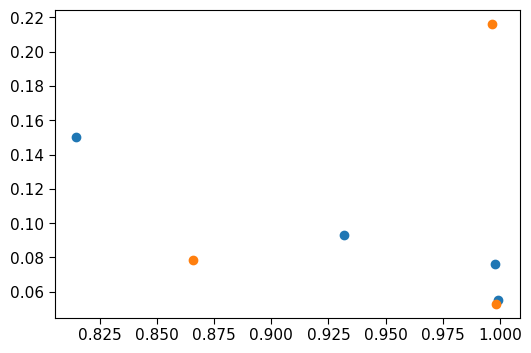

In [80]:
fig, ax = plt.subplots(figsize=(6, 4))

dataset_name = "2d_son_small"
model_filters = {
    k: v
    for k, v in sampling_vs_summing_model_filters(data_dir_by_dataset[dataset_name]).items()
    if "(sum)" in k
}
results = load_results_for_dataset_name(dataset_name)

results_by_model = collect_models(results, model_filters)

for model_name, model_results in results_by_model.items():
    ax.scatter(
        model_results["eval.noise_disentanglement"],
        model_results["eval.causal_informativeness_test"],
        label=model_name,
    )

### Levels of learning/understanding

Comparing
- reconstruction loss when projecting to causal variables
- qualitative interventions
  - on noise
  - on causal variables

In [91]:
# SO(n)
run_names_by_level_son = {
    1: "unequaled-ray-84",  # mlp, 0.05 child noise
    2: "luxuriant-fish-118",  # mlp, 0.05 child noise
    # 3: "efficient-shrike-485",  # mlp, equi child noise
    3: "awesome-koi-351",  # mlp, equi child noise
    4: "clumsy-stork-239",  # linear, equi child noise
}
exp_name_son = "final_2dcubes_son_causal_variables"


# image encodings
run_names_by_level_image = {3: "gentle-mole-565", 4: "burly-gnu-299"}
exp_name_image = "final_2dcubes_image_encodings"

Finding unequaled-ray-84...


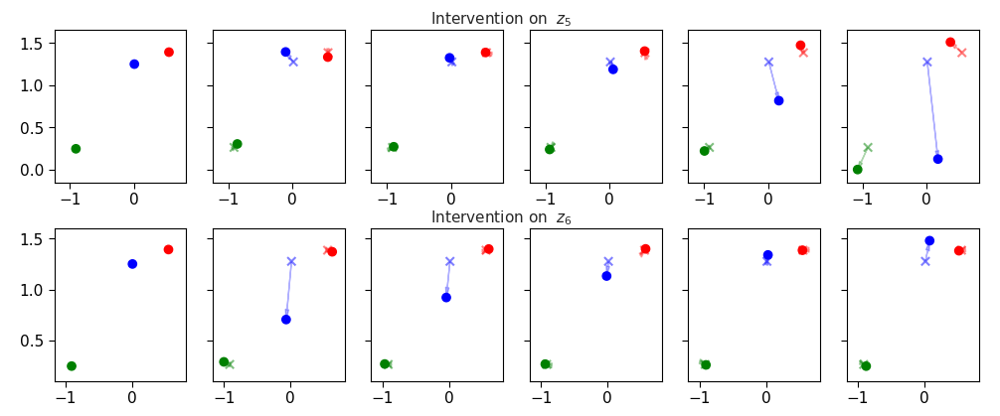

In [102]:
run_name = run_names_by_level_son[1]
exp_name = get_run_dir_for_run_name(
    run_name,
    exp_name_prefix=exp_name_son,
).name
step = None
step_name = "final"

model, cfg, train_loader, val_loader, device = setup_evaluation(exp_name, step=step)
plot_dir = Path(f"./figures/{run_name}_step_final")
plot_dir.mkdir(parents=True, exist_ok=True)

n_samples = 1
n_interventions = 5
intervention_scale = 5.0
plot_dir = Path(plot_dir)

MAP_components = compute_MAP_components(cfg, model, val_loader, device)

fig, axes = plot_counterfactual_sequences(
    cfg,
    model,
    val_loader,
    device,
    n_samples=n_samples,
    n_interventions=n_interventions,
    intervention_scale=intervention_scale,
    # intervention_type="decode_causal",
    intervention_type="decode_noise",
    components=[4, 5],
    filename=plot_dir
    / f"level_1_plot_counterfactual_sequences_decode_noise_components_4_5_step_{step_name}.png",
    save_to_mlflow=False,
)
fig

Finding luxuriant-fish-118...
tensor([4, 2, 5, 3, 1, 0], device='cuda:1')


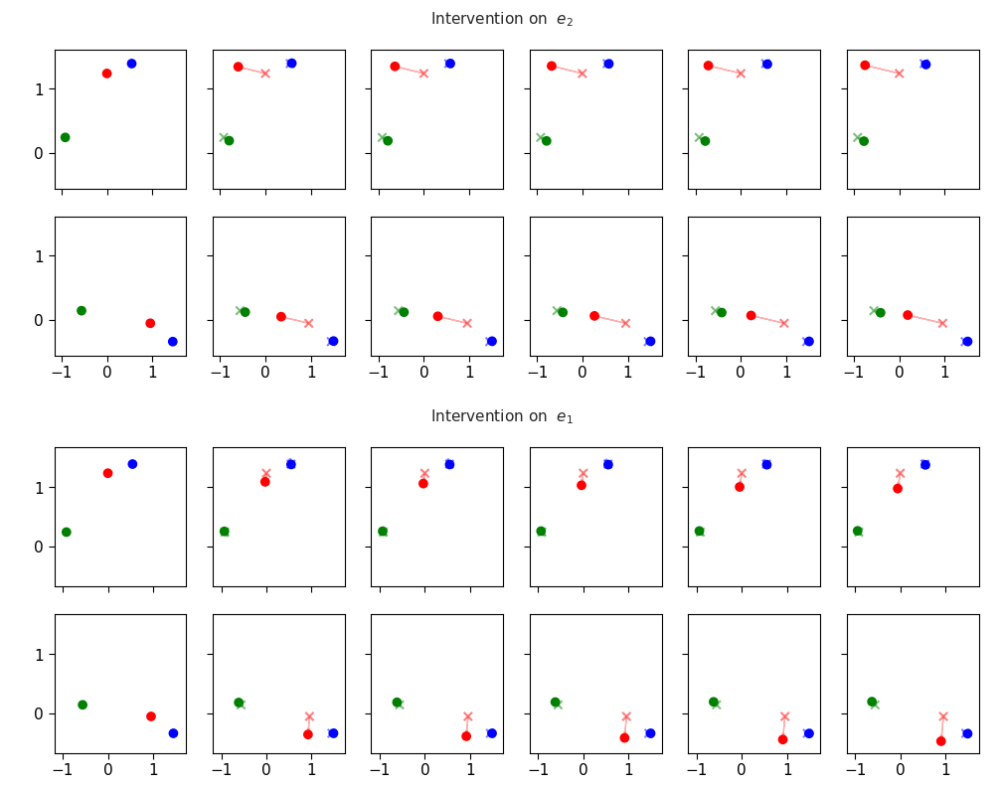

In [59]:
run_name = run_names_by_level_son[2]
exp_name = get_run_dir_for_run_name(
    run_name,
    exp_name_prefix=exp_name_son,
).name
step = None

model, cfg, train_loader, val_loader, device = setup_evaluation(exp_name, step=step)
plot_dir = Path(f"./figures/{run_name}_step_final")
plot_dir.mkdir(parents=True, exist_ok=True)

MAP_components = compute_MAP_components(cfg, model, val_loader, device)

n_samples = 2
n_interventions = 5
intervention_scale = 1.0
plot_dir = Path(plot_dir)

fig, axes = plot_counterfactual_sequences(
    cfg,
    model,
    val_loader,
    device,
    n_samples=n_samples,
    n_interventions=n_interventions,
    intervention_scale=intervention_scale,
    # intervention_type="decode_causal",
    intervention_type="decode_noise",
    components=[MAP_components[4], MAP_components[5]],
    filename=plot_dir
    / f"level_2_plot_counterfactual_sequences_decode_noise_components_4_5_step_{step_name}.{format}",
    save_to_mlflow=False,
)
fig

Finding luxuriant-fish-118...


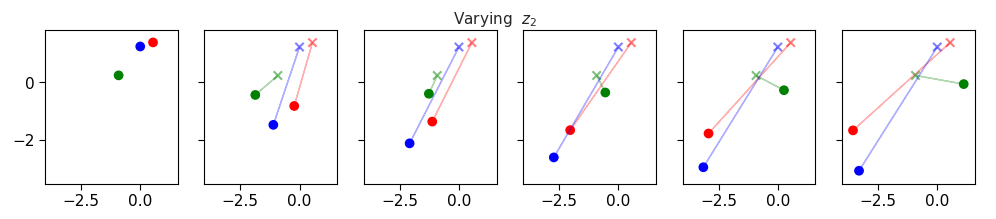

In [103]:
run_name = run_names_by_level_son[2]
exp_name = get_run_dir_for_run_name(
    run_name,
    exp_name_prefix=exp_name_son,
).name
step = None

model, cfg, train_loader, val_loader, device = setup_evaluation(exp_name, step=step)
plot_dir = Path(f"./figures/{run_name}_step_final")
plot_dir.mkdir(parents=True, exist_ok=True)

MAP_components = compute_MAP_components(cfg, model, val_loader, device)

n_samples = 1
n_interventions = 5
plot_dir = Path(plot_dir)

fig, axes = plot_counterfactual_sequences(
    cfg,
    model,
    val_loader,
    device,
    n_samples=n_samples,
    n_interventions=n_interventions,
    intervention_scale=5.0,
    # intervention_type="decode_causal",
    intervention_type="decode_noise",
    components=[MAP_components[4]],
    filename=plot_dir
    / f"level_2_plot_counterfactual_sequences_decode_noise_components_4_step_{step_name}.png",
    save_to_mlflow=False,
    perfect_intervention=False,
)
fig, axes = plot_counterfactual_sequences(
    cfg,
    model,
    val_loader,
    device,
    n_samples=n_samples,
    n_interventions=n_interventions,
    intervention_scale=1.0,
    # intervention_type="decode_causal",
    intervention_type="decode_causal",
    components=[MAP_components[4]],
    filename=plot_dir
    / f"level_2_plot_counterfactual_sequences_decode_causal_components_4_step_{step_name}.png",
    save_to_mlflow=False,
    perfect_intervention=False,
)
fig

In [128]:
def plot_levels(
    data_cfg,
    run_dirs,
    loader,
    device,
    plot_type,
    intervention_component=None,
    intervention_scale=1.0,
    i=0,
):
    nrows = len(run_dirs)
    ncols = 2

    fig, axes = plt.subplots(
        nrows=nrows, ncols=ncols, figsize=(ncols * 4, nrows * 4), sharey=True, sharex=True
    )
    if nrows == 1:
        axes = np.expand_dims(axes, axis=0)

    x1, x2, *_ = get_first_batch(loader)
    x1, x2 = x1.to(device), x2.to(device)

    for j, (level, run_dir) in enumerate(run_dirs.items()):
        model, *_ = setup_evaluation(run_dir.name, step=None)

        if len(x2.shape) > 2:
            x2 = x2[:, -1]

        if plot_type == "reconstructions":
            x1_noise = model.encode_decode(x1, deterministic=True)
            # x2_reco_from_noise = model.encode_decode(x2, deterministic=True)
            x1_causal = model.decode_causal(
                model.encode_to_causal(x1, deterministic=True), deterministic=True
            )
        elif plot_type == "interventions":
            assert intervention_component is not None

            MAP_components = compute_MAP_components(data_cfg, model, val_loader, device)
            e1 = model.encode_to_noise(x1, deterministic=True)
            z1 = model.scm.noise_to_causal(e1)

            e1_std = e1.std(dim=0)
            z1_std = z1.std(dim=0)
            x1_noise, _ = intervene(
                model,
                e1,
                MAP_components[intervention_component],
                mode="fixed",
                value=intervention_scale * e1_std[MAP_components[intervention_component]]
                + e1[i, MAP_components[intervention_component]],
                intervention_type="decode_noise",
            )
            x1_causal, _ = intervene(
                model,
                z1,
                MAP_components[intervention_component],
                mode="fixed",
                value=intervention_scale * z1_std[MAP_components[intervention_component]]
                + z1[i, MAP_components[intervention_component]],
                intervention_type="decode_causal",
            )
        # x2_reco_from_causal = model.decode_causal(
        #     model.encode_to_causal(x2, deterministic=True), deterministic=True
        # )

        # plot_x(data_cfg, x1[i], ax=axes[j, 0], x1=x1[i], plot_arrows=True)
        plot_x(data_cfg, x1_noise[i], ax=axes[j, 0], x1=x1[i], plot_arrows=True)
        plot_x(data_cfg, x1_causal[i], ax=axes[j, 1], x1=x1[i], plot_arrows=True)

    # set titles
    for i, ax in enumerate(axes[0]):
        # ax.set_title(["Data", "Reconstruction from noise", "Reconstruction from causal"][i])
        if plot_type == "reconstructions":
            ax.set_title(["Reconstruction from noise", "Reconstruction from causal"][i])
        elif plot_type == "interventions":
            ax.set_title([f"Intervening on $z_{intervention_component + 1}$", f"Varying on $z_{intervention_component + 1}$"][i])

    # set row titles
    for level, ax in zip(run_dirs.keys(), axes[:, 0]):
        ax.set_ylabel(f"Level {level}")
        # rotate row label 90 degrees
        ax.yaxis.set_label_coords(-0.2, 0.5)

    if plot_type == "reconstructions":
        filename = f"./figures/levels_{plot_type}_{exp_name}.png"
    elif plot_type == "interventions":
        filename = f"./figures/levels_{plot_type}_{intervention_component}_{exp_name}.png"
    print(filename)
    fig.savefig(filename)

#### SO(n)

In [106]:
run_dirs_son = {
    level: get_run_dir_for_run_name(run_name, exp_name_prefix=exp_name_son)
    for level, run_name in run_names_by_level_son.items()
}

_, data_cfg, train_loader, val_loader, device = setup_evaluation(
    list(run_dirs_son.values())[0].name, step=None
)

Finding unequaled-ray-84...
Finding luxuriant-fish-118...
Finding awesome-koi-351...
Finding clumsy-stork-239...


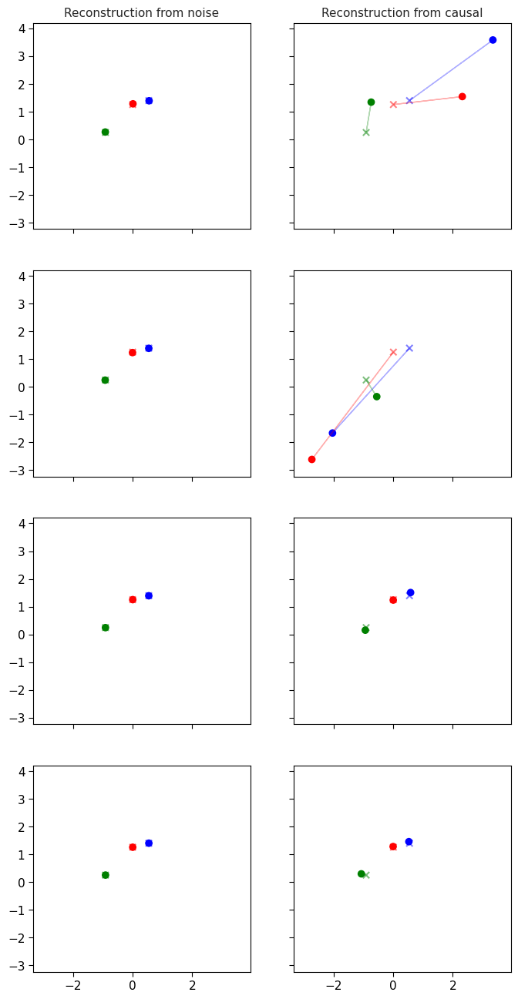

In [40]:
plot_levels(data_cfg, run_dirs_son, val_loader, device, "reconstructions")

tensor([1, 0, 2, 3, 5, 5], device='cuda:1')
tensor([4, 2, 5, 3, 1, 0], device='cuda:1')
tensor([4, 3, 2, 0, 5, 1], device='cuda:1')
tensor([2, 3, 4, 1, 5, 0], device='cuda:1')


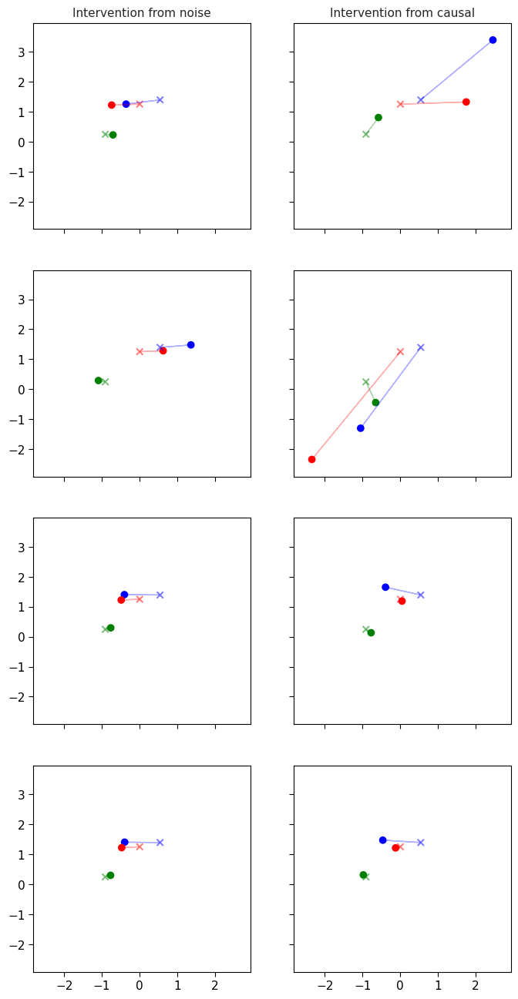

In [41]:
plot_levels(data_cfg, run_dirs_son, val_loader, device, "interventions", 0)

tensor([1, 0, 2, 3, 5, 5], device='cuda:1')
tensor([4, 2, 5, 3, 1, 0], device='cuda:1')
tensor([4, 3, 2, 0, 5, 1], device='cuda:1')
tensor([2, 3, 4, 1, 5, 0], device='cuda:1')


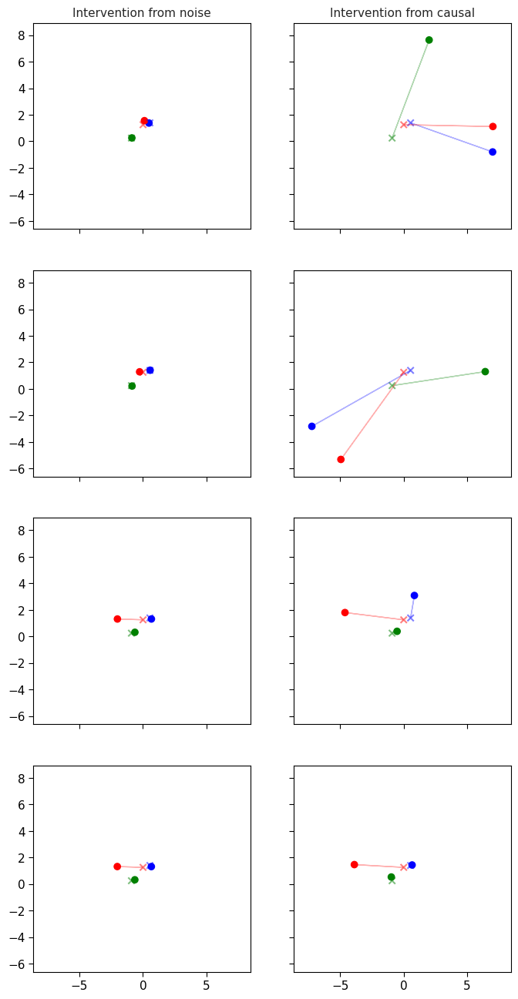

In [42]:
plot_levels(data_cfg, run_dirs_son, val_loader, device, "interventions", 4, intervention_scale=5.0)

./figures/levels_interventions_4_final_2dcubes_son_causal_variables_backup_2024-05-29_02:13:52.png


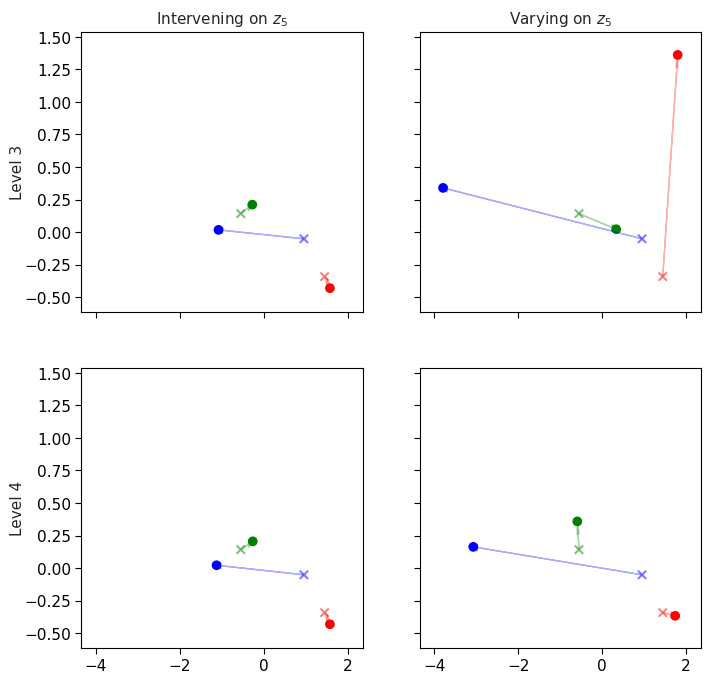

In [129]:
run_dirs_levels_3_4 = {3: run_dirs_son[3], 4: run_dirs_son[4]}
plot_levels(
    data_cfg, run_dirs_levels_3_4, val_loader, device, "interventions", 4, intervention_scale=5.0, i=1
)

#### Image encodings

In [43]:
run_dirs_image = {
    level: get_run_dir_for_run_name(run_name, exp_name_prefix=exp_name_image)
    for level, run_name in run_names_by_level_image.items()
}

_, data_cfg, train_loader, val_loader, device = setup_evaluation(
    list(run_dirs_image.values())[0].name, step=None
)

Finding gentle-mole-565...
Finding burly-gnu-299...


/mnt/antares_raid/home/jonasb/mambaforge/envs/wscrl/lib/python3.8/site-packages/torch/nn/modules/conv.py:459: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1682343998658/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,


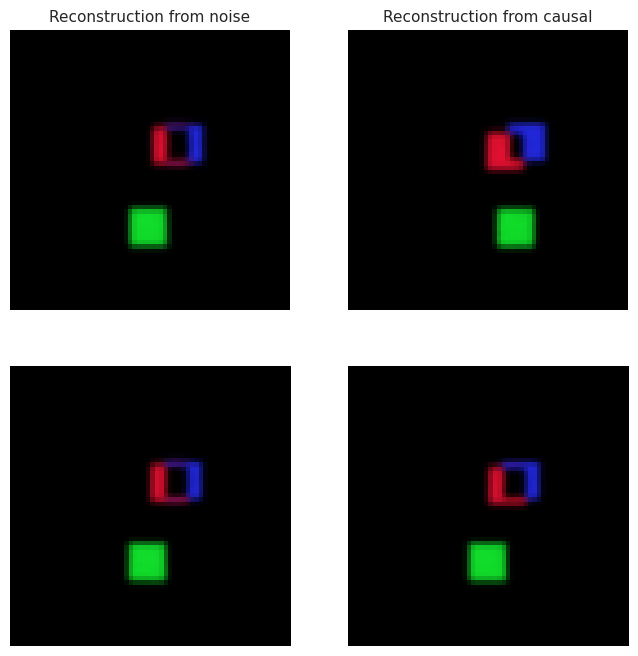

In [44]:
plot_levels(data_cfg, run_dirs_image, val_loader, device, "reconstructions")

tensor([4, 0, 3, 2, 5, 1], device='cuda:0')
tensor([0, 4, 3, 2, 5, 1], device='cuda:0')


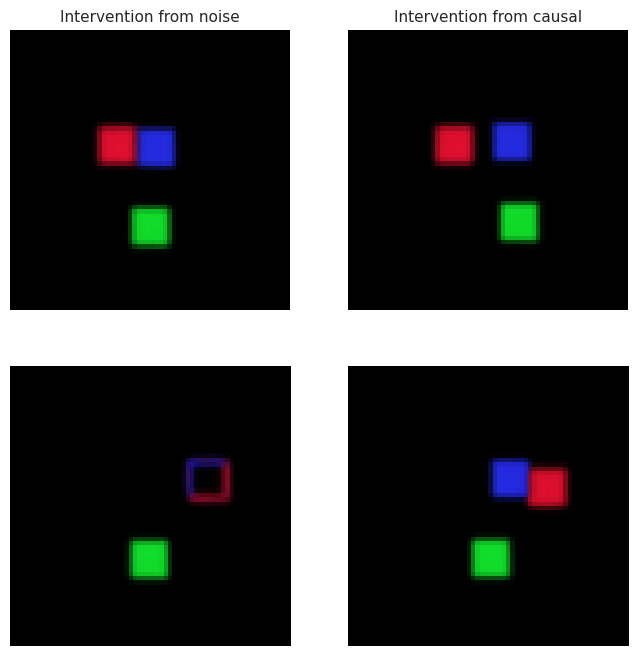

In [45]:
plot_levels(data_cfg, run_dirs_image, val_loader, device, "interventions", 0)

tensor([4, 0, 3, 2, 5, 1], device='cuda:0')
tensor([0, 4, 3, 2, 5, 1], device='cuda:0')


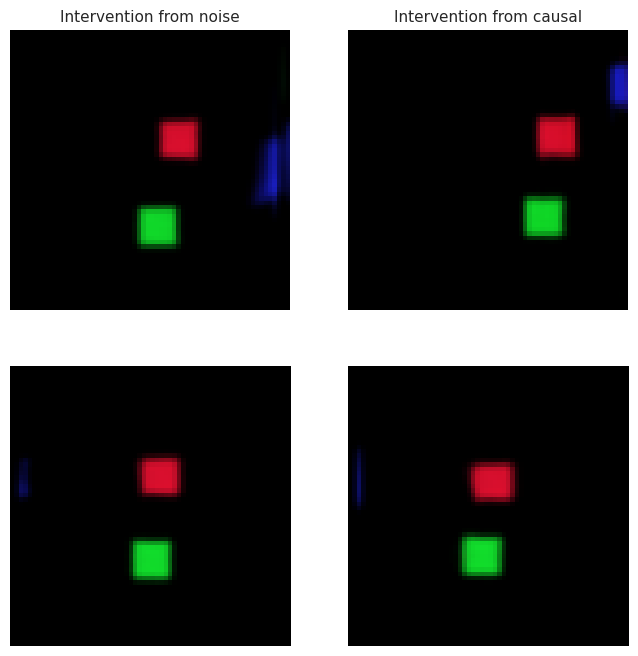

In [46]:
plot_levels(
    data_cfg, run_dirs_image, val_loader, device, "interventions", 4, intervention_scale=5.0
)

### Examples

In [72]:
def plot_counterfactual_sequences_for_run_name(
    run_name,
    exp_name_prefix,
    intervention_type="decode_causal",
    intervention_component=0,
    format="png",
    n_samples=1,
    n_interventions=5,
    model_name=None,
    filename_prefix="counterfactual_sequence",
):
    exp_name = get_run_dir_for_run_name(
        run_name,
        exp_name_prefix=exp_name_prefix,
    ).name
    step = None

    model, cfg, train_loader, val_loader, device = setup_evaluation(exp_name, step=step)
    plot_dir = Path(f"./figures")
    plot_dir.mkdir(parents=True, exist_ok=True)

    MAP_components = compute_MAP_components(cfg, model, val_loader, device)

    plot_dir = Path(plot_dir)

    if intervention_type == "decode_causal":
        title = f"Varying $z_{intervention_component + 1}$"
    elif intervention_type == "decode_noise":
        title = f"Intervening on $z_{intervention_component + 1}$"

    if model_name is not None:
        title = f"{model_name} - {title}"

    fig, axes = plot_counterfactual_sequences(
        cfg,
        model,
        val_loader,
        device,
        n_samples=n_samples,
        n_interventions=n_interventions,
        intervention_scale=1.0,
        # intervention_type="decode_causal",
        intervention_type=intervention_type,
        components=[MAP_components[intervention_component]],
        filename=plot_dir
        / f"{filename_prefix}_{model_name if model_name is not None else run_name}_{intervention_type}.{format}",
        save_to_mlflow=False,
        perfect_intervention=False,
        title=title,
    )

    return fig, axes

#### Best low dim sequence

In [74]:
dataset_name = "2d_son_equi"
results = load_results_for_dataset_name(dataset_name)
model_filters = compare_transforms_model_filters(data_dir_by_dataset[dataset_name])

best_low_dim_models = get_best_models(results, "eval.causal_disentanglement", model_filters)
best_low_dim_models

{'Affine': 'adorable-vole-511',
 'Linear': 'capable-bee-944',
 'Residual': 'enchanting-zebra-965',
 'Residual Monotonic': 'dashing-flea-40'}

Finding adorable-vole-511...
Finding adorable-vole-511...


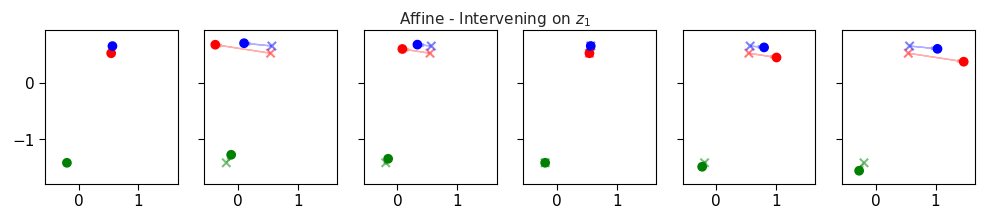

In [82]:
model_name = "Affine"
run_name = best_low_dim_models[model_name]
exp_name_prefix = exp_name_son
exp_name = get_run_dir_for_run_name(
    run_name,
    exp_name_prefix=exp_name_prefix,
).name
step = None

fig, _ = plot_counterfactual_sequences_for_run_name(
    run_name,
    exp_name_prefix,
    "decode_noise",
    model_name=model_name,
    filename_prefix="best_low_dim_sequence",
)
fig

Finding adorable-vole-511...


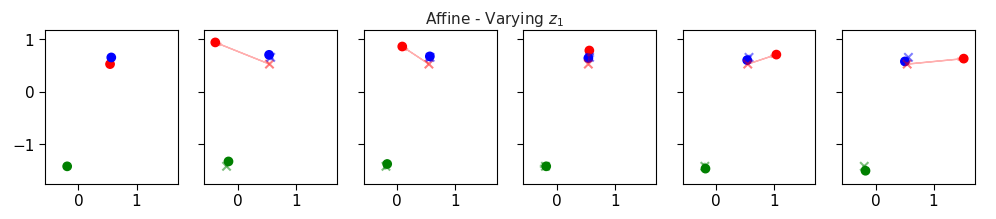

In [83]:
fig, _ = plot_counterfactual_sequences_for_run_name(
    run_name,
    exp_name_prefix,
    "decode_causal",
    model_name=model_name,
    filename_prefix="best_low_dim_sequence",
)
fig

Finding enchanting-zebra-965...


Finding enchanting-zebra-965...


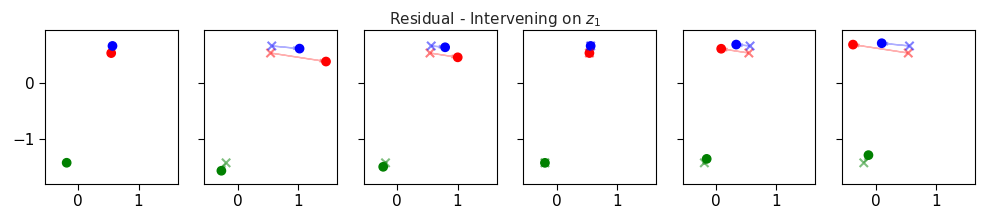

In [84]:
model_name = "Residual"
run_name = best_low_dim_models[model_name]
exp_name_prefix = exp_name_son
exp_name = get_run_dir_for_run_name(
    run_name,
    exp_name_prefix=exp_name_prefix,
).name
step = None

fig, _ = plot_counterfactual_sequences_for_run_name(
    run_name,
    exp_name_prefix,
    "decode_noise",
    model_name=model_name,
    filename_prefix="best_low_dim_sequence",
)
fig

Finding enchanting-zebra-965...


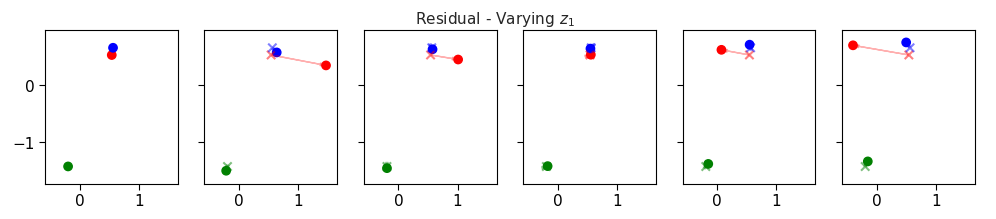

In [85]:
fig, _ = plot_counterfactual_sequences_for_run_name(
    run_name,
    exp_name_prefix,
    "decode_causal",
    model_name=model_name,
    filename_prefix="best_low_dim_sequence",
)
fig

#### Best image encoding sequence

In [22]:
dataset_name = "2d_encoding_equi"
results = load_results_for_dataset_name(dataset_name)
model_filters = compare_transforms_model_filters(data_dir_by_dataset[dataset_name])

best_image_encoding_models = get_best_models(results, "eval.causal_disentanglement", model_filters)
best_image_encoding_models

{'Affine': 'gentle-mole-565',
 'Linear': 'burly-gnu-299',
 'Residual': 'shivering-vole-104',
 'Residual Monotonic': 'orderly-moth-559'}

Finding shivering-vole-104...


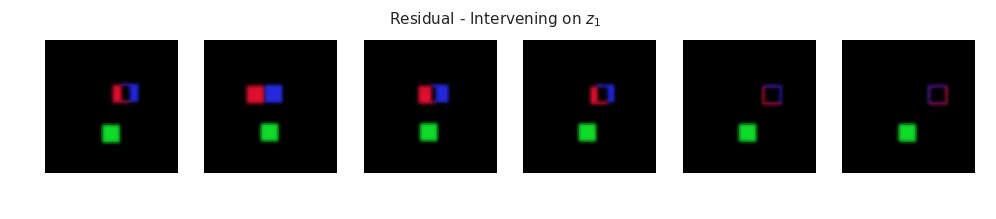

In [88]:
model_name = "Residual"
run_name = best_image_encoding_models[model_name]
exp_name_prefix = exp_name_image

fig, _ = plot_counterfactual_sequences_for_run_name(
    run_name,
    exp_name_prefix,
    "decode_noise",
    model_name=model_name,
    filename_prefix="best_image_encoding_sequence",
)
fig

Finding shivering-vole-104...


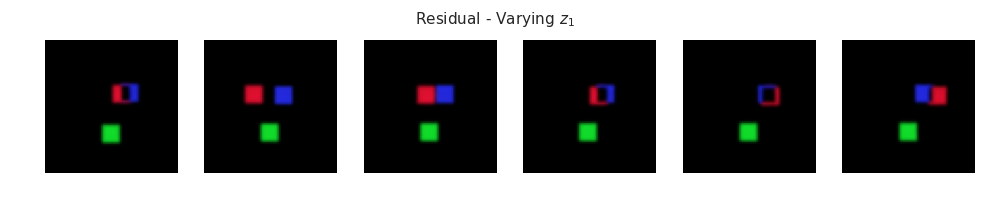

In [89]:
fig, _ = plot_counterfactual_sequences_for_run_name(
    run_name,
    exp_name_prefix,
    "decode_causal",
    model_name=model_name,
    filename_prefix="best_image_encoding_sequence",
)
fig

Finding gentle-mole-565...
Finding gentle-mole-565...


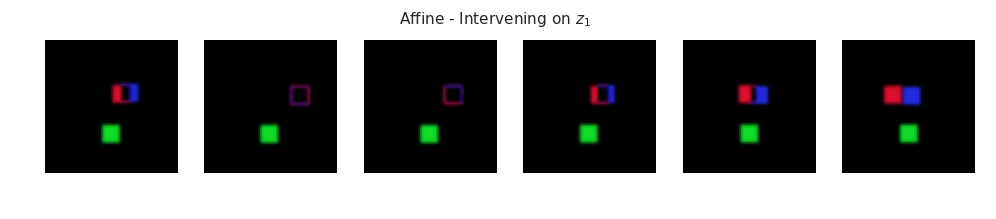

In [70]:
model_name = "Affine"
run_name = best_image_encoding_models[model_name]
exp_name = get_run_dir_for_run_name(
    run_name,
    exp_name_prefix=exp_name_image,
).name
step = None

fig, _ = plot_counterfactual_sequences_for_run_name(
    run_name,
    exp_name_prefix,
    "decode_noise",
    model_name=model_name,
    filename_prefix="best_image_encoding_sequence",
)
fig

Finding gentle-mole-565...


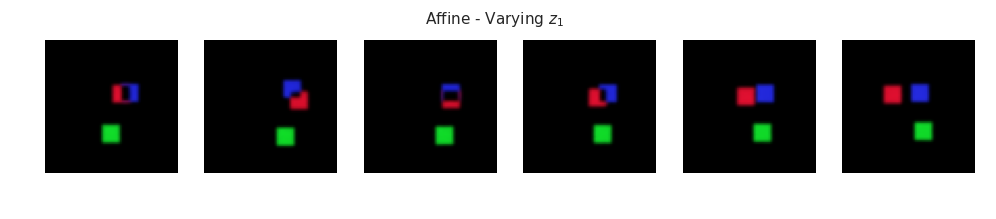

In [71]:
fig, _ = plot_counterfactual_sequences_for_run_name(
    run_name,
    exp_name_prefix,
    "decode_causal",
    model_name=model_name,
    filename_prefix="best_image_encoding_sequence",
)
fig

## Datasets

In [130]:
# 2dcubes_equiscale_perspective_equi_child_noise_blackbg
# 2dcubes_equiscale_equi_child_noise_blackbg
# 2dcubes_equiscale_0.05_child_noise_blackbg
dataset_name = "2dcubes_equiscale_0.05_child_noise_blackbg"
filetype = "npz"

In [131]:
data_dir = Path(base_dir) / "data"
dataset_dir = data_dir / dataset_name

In [132]:
data = np.load(dataset_dir / f"train.{filetype}")
x = data["imgs"]
x.shape

(25000, 2, 128, 128, 3)

In [133]:
x1 = torch.tensor(x[:, 0]) / 255.0
x2 = torch.tensor(x[:, 1]) / 255.0
x1.shape, x2.shape

(torch.Size([25000, 128, 128, 3]), torch.Size([25000, 128, 128, 3]))

In [134]:
from ws_crl.plotting import plot_grid

plot_grid(None, x1, filename=f"./figures/{dataset_name}_x1.{format}")

In [137]:
indices = [1, 2, 3, 4]

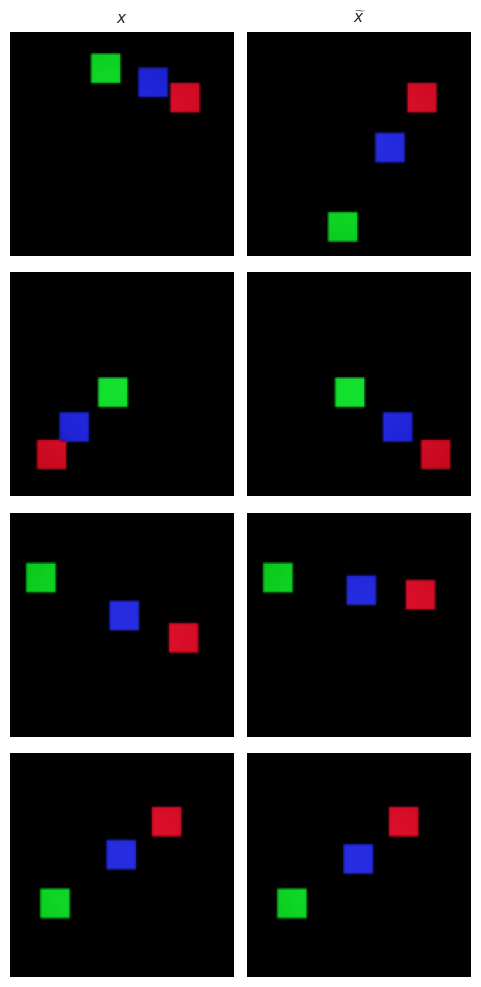

In [139]:
from ws_crl.plotting import plot_columns

fig, axes = plot_columns(
    None,
    [x1[indices], x2[indices]],
    col_names=["$x$", "$\widetilde{x}$"],
    filename=f"./figures/{dataset_name}_x1_x2.png",
)
fig

## Plot sequence

In [ ]:
dataset_name = "2dcubes_equiscale_perspective_equi_child_noise_5seq_blackbg"
filetype = "npz"

In [ ]:
data_dir = Path(base_dir) / "data"
dataset_dir = data_dir / dataset_name

In [ ]:
data = np.load(dataset_dir / f"train.{filetype}")
x = torch.tensor(data["imgs"]) / 255.0
x.shape

torch.Size([100, 6, 128, 128, 3])

In [ ]:
x1 = x[:, 0]
x2_sequence = x[:, 1:]
x1.shape, x2_sequence.shape

(torch.Size([100, 128, 128, 3]), torch.Size([100, 5, 128, 128, 3]))

In [ ]:
from ws_crl.plotting import plot_columns

indices = [1, 6, 10, 12]
plot_columns(
    None,
    [x[indices, i] for i in range(x.shape[1])],
    nrows=len(indices),
    col_names=["$x$"] + [f"$\widetilde{{x}}_{{{i + 1}}}$" for i in range(x2_sequence.shape[1])],
    filename=f"./figures/{dataset_name}_sequence.{format}",
)

## 1D cubes example

In [11]:
noise3 = (0.0, 0.0)

pos1 = (-0.8, 0.8)
pos2 = (0.8, 0.8)
# domain = (0.1, 0.9)
domain = (-1, 1)

pos1, pos2, noise3 = np.array(pos1), np.array(pos2), np.array(noise3)

(<Figure size 550x550 with 1 Axes>,
 <Axes: >,
 ([<matplotlib.collections.PathCollection at 0x7f46ef03ffa0>,
  ['$x_1$', '$x_2$', '$p(\\widetilde{e}|e, I)$']))

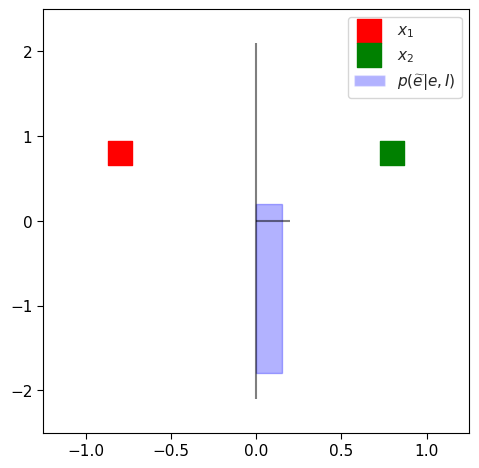

In [12]:
def plot_objects_with_distribution(
    pos1, pos2, noise3, domain, ax, latent_type="z", plot_legend=True
):
    if ax is None:
        fig, ax = plt.subplots()
    else:
        fig = ax.figure
    domain_margin = 0.25
    mean_pos = (pos1 + pos2) / 2
    # pos3 = mean_pos + noise3

    center = (domain[1] - domain[0]) / 2 + domain[0]

    ax.set_xlim(domain[0] - domain_margin, domain[1] + domain_margin)
    ax.set_ylim((domain[0] - domain_margin) * 2, (domain[1] + domain_margin) * 2)
    colors = ["red", "green", "blue"]

    # plot vertical distribution for y3
    distribution_margin = 0.1
    distribution_axis_height = 0.2

    if latent_type == "z":
        distribution_center = center
        distribution_label = "$p(\widetilde{z}|e, I)$"
        color = "purple"
    elif latent_type == "e":
        distribution_center = mean_pos[1]
        distribution_label = "$p(\widetilde{e}|e, I)$"
        color = "blue"
    ax.vlines(
        mean_pos[0],
        ymin=domain[0] * 2 - distribution_margin,
        ymax=domain[1] * 2 + distribution_margin,
        color="black",
        linestyle="-",
        alpha=0.5,
    )
    ax.hlines(
        0,
        xmin=mean_pos[0],
        xmax=mean_pos[0] + distribution_axis_height,
        color="black",
        linestyle="-",
        alpha=0.5,
    )
    # plot uniform distribution over domain using a rectangle and the axis drawn above
    distribution_height = 0.15
    ax.add_patch(
        plt.Rectangle(
            xy=(mean_pos[0], -distribution_center + domain[0]),
            width=distribution_height,
            height=domain[1] - domain[0],
            color=color,
            alpha=0.3,
        )
    )

    # add $p(z)$ to legend as blue rectangle
    custom_legend_symbols = [plt.Rectangle((0, 0), 1, 1, fc="blue", alpha=0.3)]
    custom_legend_labels = [distribution_label]

    scatters = []

    for i, (pos, color) in enumerate(zip([pos1, pos2], colors)):
        s = ax.scatter(*pos, color=color, label=f"$x_{i+1}$", marker="s", s=300)
        scatters.append(s)
    legend_symbols = scatters + custom_legend_symbols
    legend_labels = [s.get_label() for s in scatters] + custom_legend_labels

    if plot_legend:
        ax.legend(legend_symbols, legend_labels)
    return fig, ax, (legend_symbols, legend_labels)


plot_objects_with_distribution(pos1, pos2, noise3, domain, ax=None, latent_type="e")

(<Figure size 550x550 with 1 Axes>,
 <Axes: >,
 ([<matplotlib.collections.PathCollection at 0x7f46eee01f70>,
  ['$x_1$', '$x_2$', '$p(\\widetilde{z}|e, I)$']))

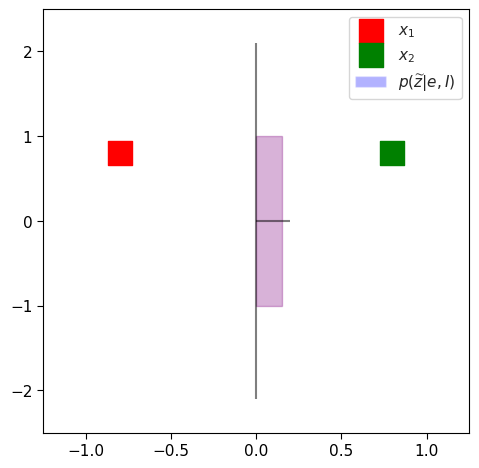

In [13]:
plot_objects_with_distribution(pos1, pos2, noise3, domain, ax=None, latent_type="z")

(<Figure size 550x550 with 1 Axes>,
 <Axes: >,
 ([<matplotlib.collections.PathCollection at 0x7f46eedaac40>,
  ['$x_1$', '$x_2$', '$p(\\widetilde{e}|e, I)$']))

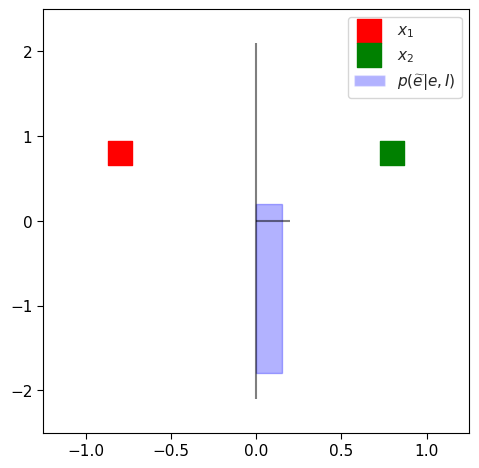

In [14]:
plot_objects_with_distribution(pos1, pos2, noise3, domain, ax=None, latent_type="e")

In [15]:
def plot_distributions_sequence(latent_type="z"):
    noise3 = (0.0, 0.0)

    pos1s = [(-0.8, 0.8), (-0.8, 0.2), (-0.8, -0.4)]
    pos2 = (0.8, 0.8)
    domain = (-1, 1)
    pos1, pos2, noise3 = np.array(pos1s), np.array(pos2), np.array(noise3)
    plot_legend = False
    ncols = len(pos1s)
    fig, axes = plt.subplots(ncols=ncols, figsize=(ncols * 4, 4))
    for ax, pos1 in zip(axes, pos1s):
        _, _, (legend_symbols, legend_labels) = plot_objects_with_distribution(
            pos1, pos2, noise3, domain, ax=ax, latent_type=latent_type, plot_legend=plot_legend
        )

    # fig.legend(legend_symbols, legend_labels, loc="lower right")
    fig.tight_layout()
    return fig

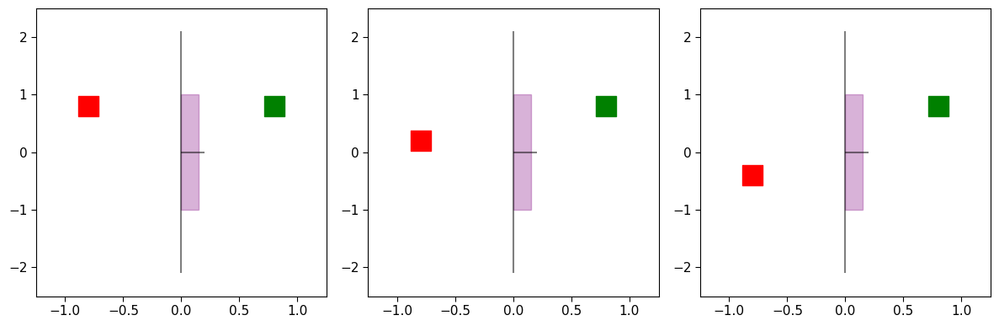

In [86]:
fig = plot_distributions_sequence(latent_type="z")
# fig.suptitle("Sequence of $z$ distributions")
fig.savefig(f"./figures/example_z_distribution.{format}")

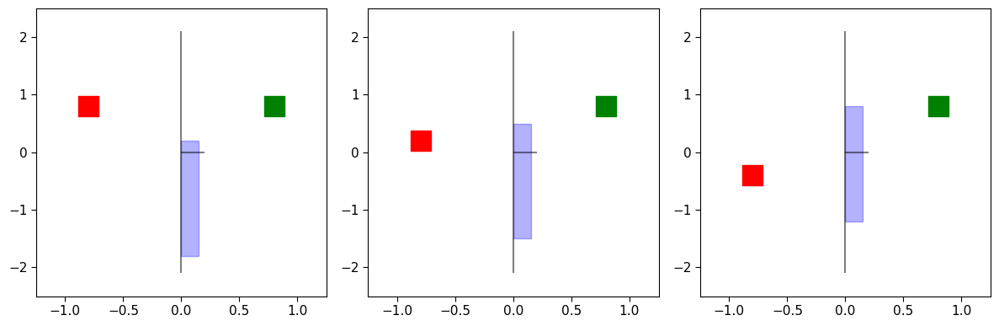

In [87]:
fig = plot_distributions_sequence(latent_type="e")
# fig.suptitle("Sequence of $e$ distributions")
fig.savefig(f"./figures/example_e_distribution.{format}")